## Lane FECopy from 7/2022
8/16/2023 - Data generated from Lentimix Library run 2 from 7/2022
Run on 6 lanes, using Library2, Library3 barcode enrichment
Analyze global run on cellranger v6 data and create h5_ad files for further analysis

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

import math
import matplotlib

import anndata
from pathlib import Path

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/3482209352.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
Path("./write").mkdir(parents=True, exist_ok=True) # write h5ad here

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
np.random.seed(1573)   #fix so we can reproduce later

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.3 scipy==1.12.0 pandas==2.2.0 scikit-learn==1.1.3 statsmodels==0.14.1 igraph==0.11.3 pynndescent==0.5.11


In [4]:
library = ["1660-Fosl2.752","1661-Fhl2.467","1663-Myc.989","1665-Yap1.735","1667-Atf4.1383","1671-Nfkb2.152",
           "1673-Relb.286","1676-Onecut2.2361","1811-Itga2.672","1999-Cldn4-951","2114-Lif.1890",
           "2115-Fosl1.1401","2118-Nfkb1.3737",'shRenilla']

In [5]:
tags = ["shRenilla_TGTCTAGT", "shRenilla_CATAGTCA", "shPatch_GTACTTGC", "shPatch_CCATTACT", 
        "1660-Fosl2.752_CGGGAATG", "1661-Fhl2.467_GCCTACGT", "1663-Myc.989_CTGAATCT",  "1665-Yap1.735_CGTTAGGG",
        "1667-Atf4.1383_TCTGGGGC", "1671-Nfkb2.152_CGTTCAAG", "1673-Relb.286_ACAGAGCC", 
        "1676-Onecut2.2361_TTAATTAG", "1811-Itga2.672_GCCAATCG", "1999-Cldn4-951_CGTTTCCT", 
        "2114-Lif.1890_ACACGTGA", "2115-Fosl1.1401_GGTAGGGA", "2118-Nfkb1.3737_CAGTGCAT"]

In [6]:
targetGenes = ['Fosl2', 'Fhl2', 'Myc', 'Yap1', 'Atf4', 'Nfkb2', 'Relb', 'Onecut2', 'Itga2', 'Cldn4', 'Lif', 'Fosl1', 'Nfkb1', 'Slc4a11', 'Tigit']

In [7]:
results_file = 'write/allmice.h5ad'  # the file that will store the analysis results

In [8]:
adata = sc.read_10x_h5('Lib2_LaneF_ECopy_filtered_feature_bc_matrix.h5', gex_only=False)

reading Lib2_LaneF_ECopy_filtered_feature_bc_matrix.h5
 (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/_core/anndata.py:1908: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [9]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [10]:
samples = list(adata[:,adata.var['feature_types']=='Antibody Capture'].var.index)

In [11]:
print(samples)

['AQ1613_B0301', 'AQ1123_B0302', 'AO1831_B0303', 'AQ1128_B0304', 'AR1152_B0305', 'AR1152a_B0306']


In [12]:
# Now filter out barcodes
hashadata = adata[:,samples]
adata = adata[:,[y for y in adata.var_names if y not in samples]]

In [13]:
hashadata.var

,gene_ids,feature_types,genome
AQ1613_B0301,AQ1613,Antibody Capture,
AQ1123_B0302,AQ1123,Antibody Capture,
AO1831_B0303,AO1831,Antibody Capture,
AQ1128_B0304,AQ1128,Antibody Capture,
AR1152_B0305,AR1152,Antibody Capture,
AR1152a_B0306,AR1152a,Antibody Capture,


## Preprocessing

Show those genes that yield the highest fraction of counts in each single cell, across all cells.

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


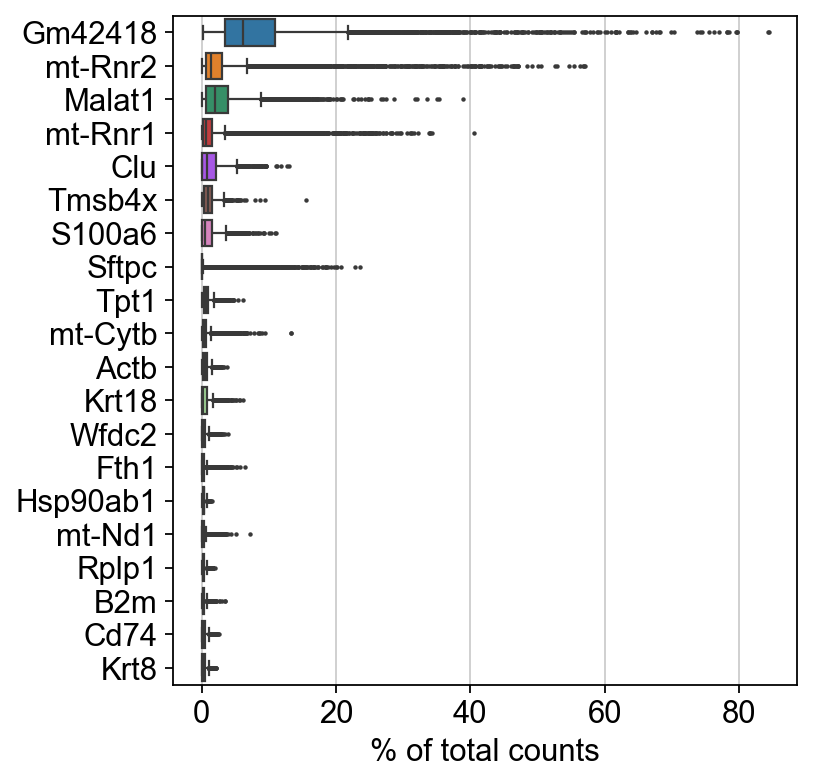

In [14]:
sc.pl.highest_expr_genes(adata, n_top=20, )

Basic filtering:

In [15]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=3)
#sc.pp.filter_cells(adata, min_counts=1500)

filtered out 163 cells that have less than 300 genes expressed
filtered out 30305 genes that are detected in less than 3 cells


In [16]:
adata.var['mt'] = adata.var_names.str.startswith('mt-') # annotate the group of mitochondrial genes as 'MT'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

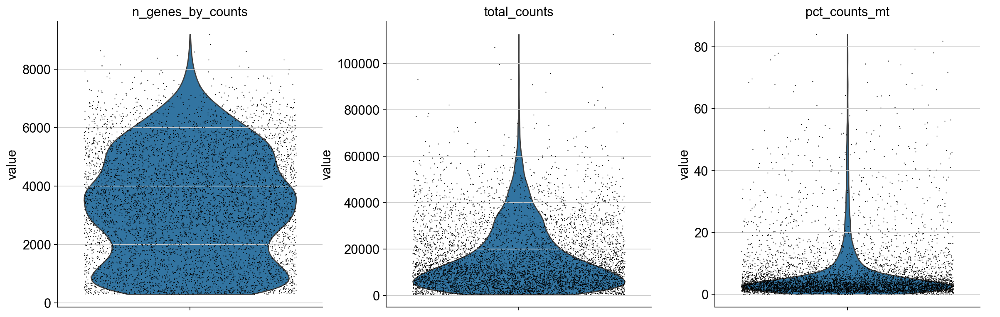

In [17]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

(array([   9.,   18.,   64.,  134.,  479., 1630., 2197., 1346.,  249.,
         134.]),
 array([0.6706066 , 0.69952066, 0.72843472, 0.75734878, 0.78626285,
        0.81517691, 0.84409097, 0.87300503, 0.90191909, 0.93083315,
        0.95974722]),
 <BarContainer object of 10 artists>)

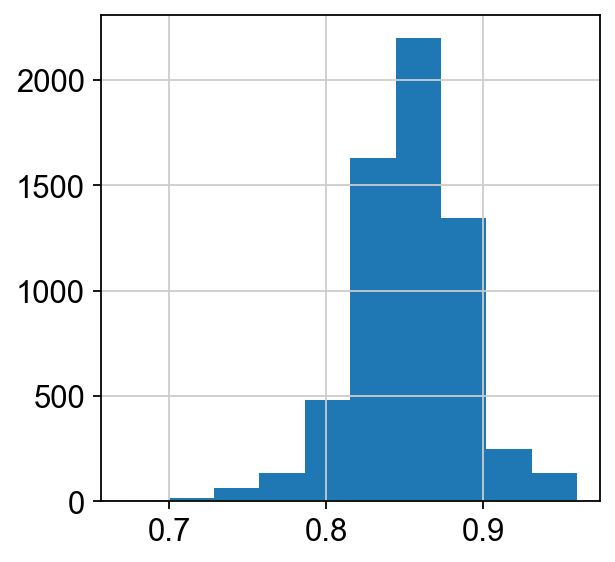

In [18]:
adata.obs["log10GenesPerUMI"] = adata.obs['n_genes_by_counts'].apply(math.log10) / adata.obs['total_counts'].apply(math.log10)
matplotlib.pyplot.hist(adata.obs["log10GenesPerUMI"])

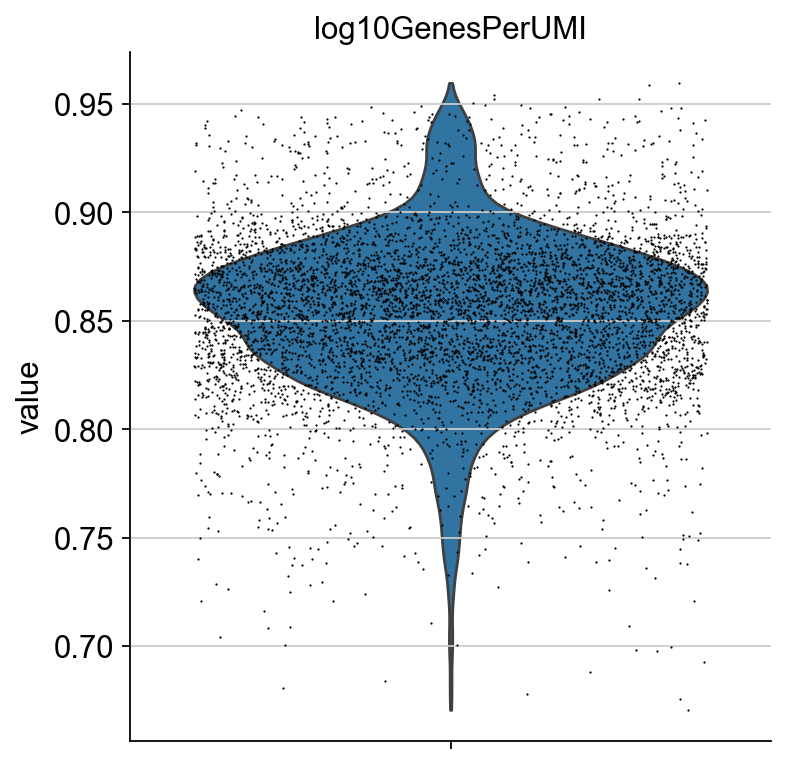

In [19]:
sc.pl.violin(adata, ['log10GenesPerUMI'],
             jitter=0.4, multi_panel=True, rotation=90)
#99% seems like a good Human pct count cutoff

Keep singlets, remove cells that have too many mouse reads, or mitochondrial genes expressed or too many total counts:

In [20]:
#Filter by Log10GenesPerUMI
adata = adata[adata.obs.log10GenesPerUMI >= 0.8,:]

In [21]:
#adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt <= 10, :]

## Run Demultiplexing

In [22]:
hashadata = hashadata[hashadata.obs.index.isin(adata.obs.index), :]

In [23]:
hashCounts = pd.DataFrame(hashadata.X.todense(), columns=hashadata.var_names, index=adata.obs.index)

In [24]:
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.99,0.999])
hashDisc

,AQ1613_B0301,AQ1123_B0302,AO1831_B0303,AQ1128_B0304,AR1152_B0305,AR1152a_B0306
count,5149.000000,5149.000000,5149.000000,5149.000000,5149.000000,5149.000000
mean,167.058853,126.688484,485.181793,351.006012,7.938823,16.809866
std,452.569000,695.765991,1248.246338,648.594299,115.815323,256.665894
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10%,1.000000,0.000000,3.000000,1.000000,0.000000,0.000000
20%,2.000000,1.000000,5.000000,2.000000,0.000000,0.000000
30%,3.000000,1.000000,7.000000,3.000000,0.000000,0.000000
40%,3.000000,2.000000,9.000000,4.000000,0.000000,0.000000
50%,5.000000,2.000000,12.000000,7.000000,0.000000,0.000000
60%,6.000000,3.000000,15.000000,30.000000,0.000000,0.000000


In [25]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
hashIDs

AQ1613_B0301
632.7999999999993
AQ1123_B0302
11.0
AO1831_B0303
1918.7999999999984
AQ1128_B0304
1185.0
AR1152_B0305
1.0
AR1152a_B0306
1.0


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False False ...  True False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/2942643048.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise 

,AQ1613_B0301,AQ1123_B0302,AO1831_B0303,AQ1128_B0304,AR1152_B0305,AR1152a_B0306
AAACCCAGTCCAGAAG-1,True,False,False,False,False,False
AAACCCATCTAGCATG-1,False,False,True,False,False,False
AAACCCATCTCCGAGG-1,False,False,False,False,False,False
AAACGAAAGTGGACGT-1,False,False,False,True,False,False
AAACGAACAACAGCCC-1,True,False,False,False,False,False
...,...,...,...,...,...,...
TTTGTTGAGGGTAGCT-1,False,False,False,False,False,False
TTTGTTGAGTTACGAA-1,False,False,False,False,False,False
TTTGTTGGTGACAGCA-1,True,False,False,False,False,False
TTTGTTGTCCATTGCC-1,False,False,False,False,False,False


In [26]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [27]:
from matplotlib import pyplot as plt

In [28]:
plt.rcParams['figure.figsize'] = (4,4)

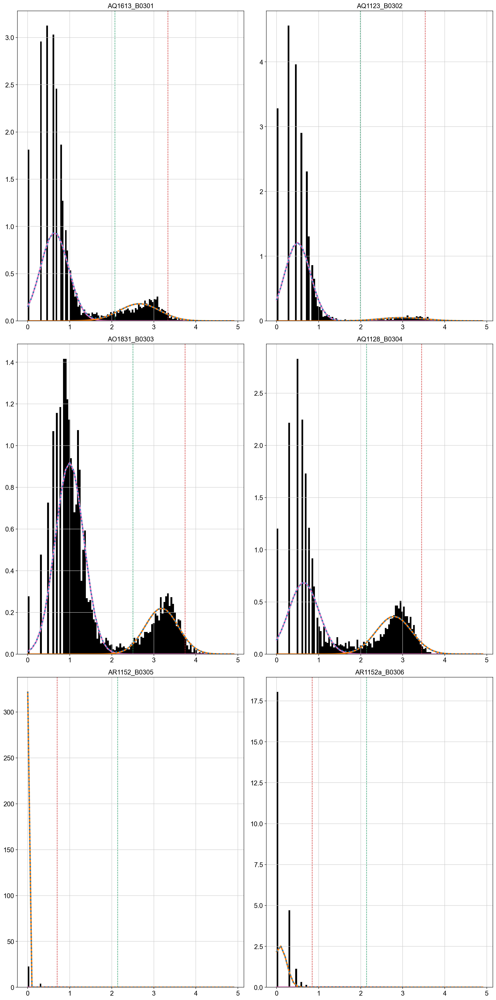

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

fig, axs = plt.subplots(3,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(hashadata.var_names)),hashadata.var_names, columns=["boundry"])
#gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.1],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(hashadata.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
        else:
            #hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .99) and np.where(fitGMM.predict_proba(binEx)[:,0] < 1e-3))[0][0]][0]
            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1 and fitGMM.predict_proba(binEx)[x][1] > .99 and fitGMM.predict_proba(binEx)[x][0] < 1e-3:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [30]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
AQ1613_B0301,2.075
AQ1123_B0302,1.990
AO1831_B0303,2.505
AQ1128_B0304,2.140
AR1152_B0305,2.140
AR1152a_B0306,2.140


In [31]:
hashCounts

,AQ1613_B0301,AQ1123_B0302,AO1831_B0303,AQ1128_B0304,AR1152_B0305,AR1152a_B0306
AAACCCAGTCCAGAAG-1,2212.0,5.0,25.0,12.0,0.0,1.0
AAACCCATCTAGCATG-1,5.0,2.0,5031.0,1.0,0.0,0.0
AAACCCATCTCCGAGG-1,4.0,3.0,13.0,242.0,0.0,0.0
AAACGAAAGTGGACGT-1,6.0,7.0,17.0,1725.0,0.0,0.0
AAACGAACAACAGCCC-1,3136.0,4.0,21.0,7.0,1.0,0.0
...,...,...,...,...,...,...
TTTGTTGAGGGTAGCT-1,195.0,3.0,2.0,0.0,0.0,0.0
TTTGTTGAGTTACGAA-1,169.0,0.0,4.0,2.0,0.0,1.0
TTTGTTGGTGACAGCA-1,3600.0,4.0,13.0,6.0,0.0,0.0
TTTGTTGTCCATTGCC-1,0.0,0.0,2.0,56.0,0.0,0.0


In [32]:
hashIDs = hashCounts.copy()
hashID = hashadata.var_names
for hashName in hashadata.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
#hashIDs.loc[:,'AT1129_B0304_2117'] = False
#hashIDs.loc[:,'AT1606_B0305_Renilla'] = False
#hashIDs.loc[:,'AT1831_B0306_2117'] = False
#hashIDs.loc[:,'AT1607_B0307_Renilla'] = False
#hashIDs.loc[:,'AV1189_B0310_2118'] = False
hashIDs

AQ1613_B0301
2.075
AQ1123_B0302
1.99
AO1831_B0303
2.505
AQ1128_B0304
2.14
AR1152_B0305
2.14
AR1152a_B0306
2.14


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[ True False False ...  True False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/1750252066.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/1750252066.py:6: FutureWarning: Setting an item of incomp

,AQ1613_B0301,AQ1123_B0302,AO1831_B0303,AQ1128_B0304,AR1152_B0305,AR1152a_B0306
AAACCCAGTCCAGAAG-1,True,False,False,False,False,False
AAACCCATCTAGCATG-1,False,False,True,False,False,False
AAACCCATCTCCGAGG-1,False,False,False,True,False,False
AAACGAAAGTGGACGT-1,False,False,False,True,False,False
AAACGAACAACAGCCC-1,True,False,False,False,False,False
...,...,...,...,...,...,...
TTTGTTGAGGGTAGCT-1,True,False,False,False,False,False
TTTGTTGAGTTACGAA-1,True,False,False,False,False,False
TTTGTTGGTGACAGCA-1,True,False,False,False,False,False
TTTGTTGTCCATTGCC-1,False,False,False,False,False,False


In [33]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [34]:
adata.obs["Classification"] = classification
hashadata.obs["Classification"] = classification
adata.obs["Classification"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/4135005838.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["Classification"] = classification
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/4135005838.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  hashadata.obs["Classification"] = classification


Classification
AQ1128_B0304     1712
negative         1051
AO1831_B0303     1000
AQ1613_B0301      917
AQ1123_B0302      311
doublet            98
AR1152a_B0306      31
AR1152_B0305       29
Name: count, dtype: int64

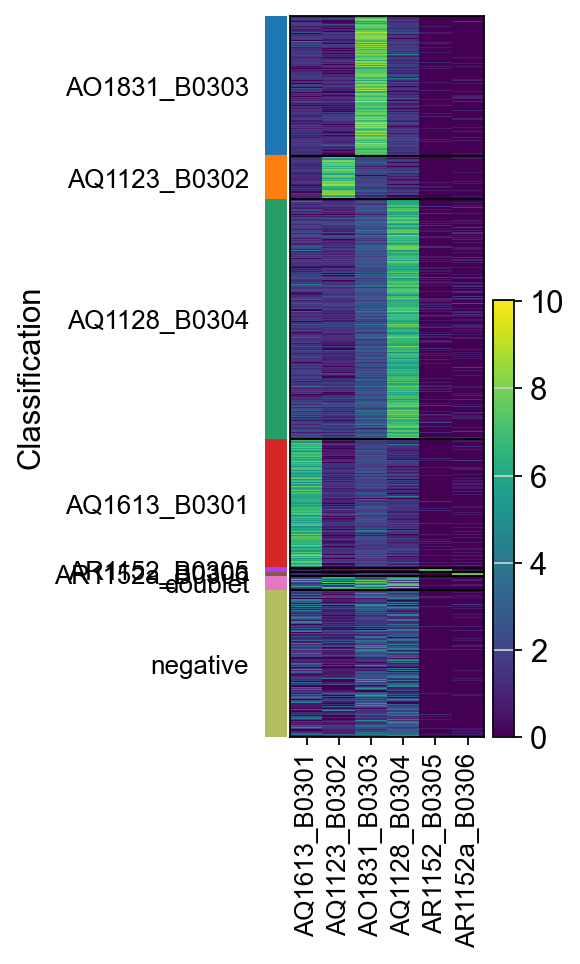

In [35]:
#output visulaization of hashing
sc.pl.heatmap(hashadata, hashadata.var_names, groupby="Classification", log=True)#, save = f"_{figName}_hash.png")

In [36]:
adata.obs.index

Index(['AAACCCAGTCCAGAAG-1', 'AAACCCATCTAGCATG-1', 'AAACCCATCTCCGAGG-1',
       'AAACGAAAGTGGACGT-1', 'AAACGAACAACAGCCC-1', 'AAACGAACAAGATTGA-1',
       'AAACGAACAGCTGTGC-1', 'AAACGAACAGGTTCAT-1', 'AAACGAAGTCACTGAT-1',
       'AAACGAAGTCCCGCAA-1',
       ...
       'TTTGGTTAGGTCGCCT-1', 'TTTGGTTCAATACGCT-1', 'TTTGGTTCACATGACT-1',
       'TTTGGTTGTCCACTCT-1', 'TTTGTTGAGAGGCGGA-1', 'TTTGTTGAGGGTAGCT-1',
       'TTTGTTGAGTTACGAA-1', 'TTTGTTGGTGACAGCA-1', 'TTTGTTGTCCATTGCC-1',
       'TTTGTTGTCTAGTTCT-1'],
      dtype='object', length=5149)

In [37]:
hashCounts = pd.DataFrame(index=adata.obs.index)

[]


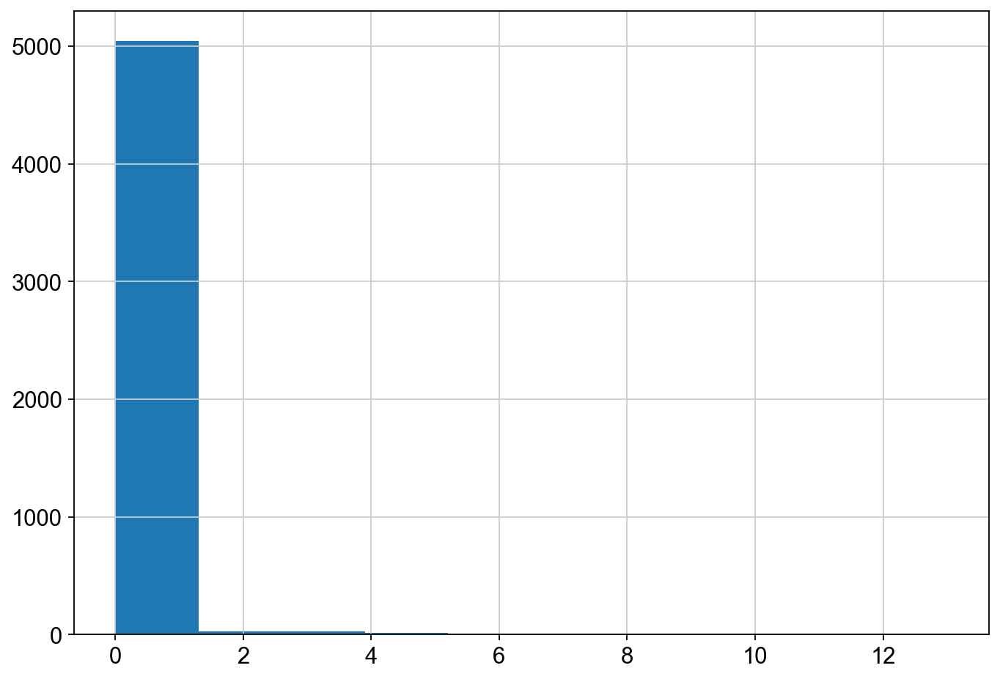

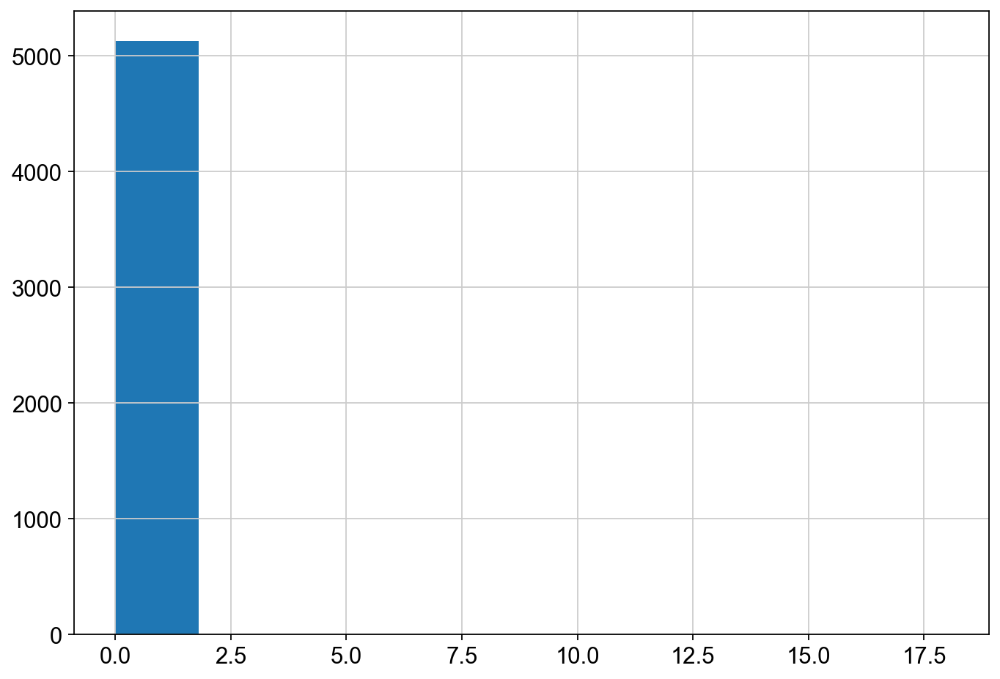

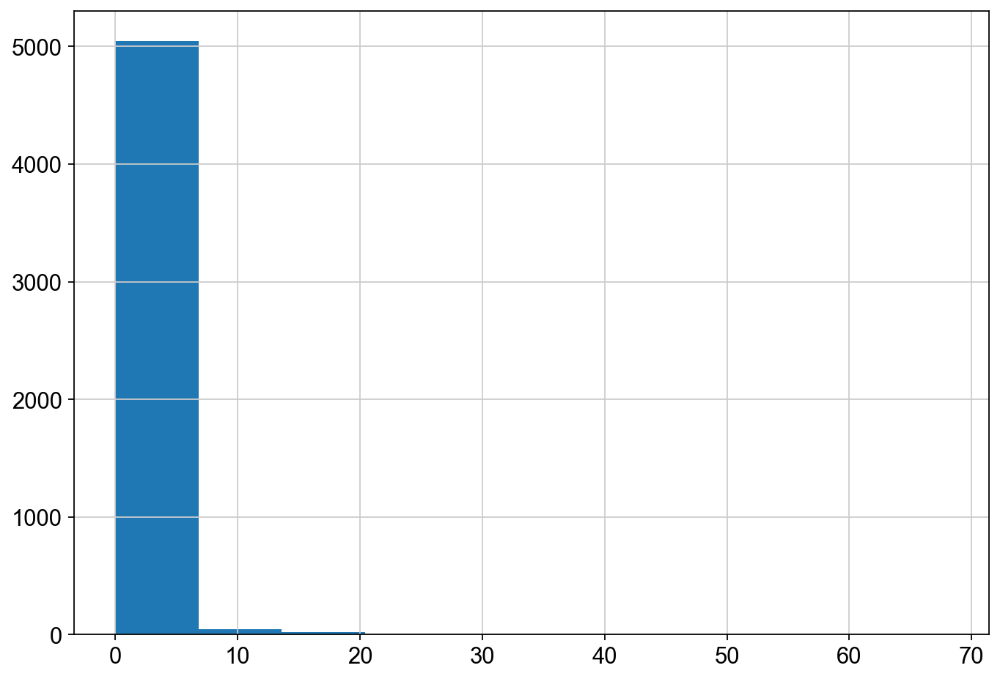

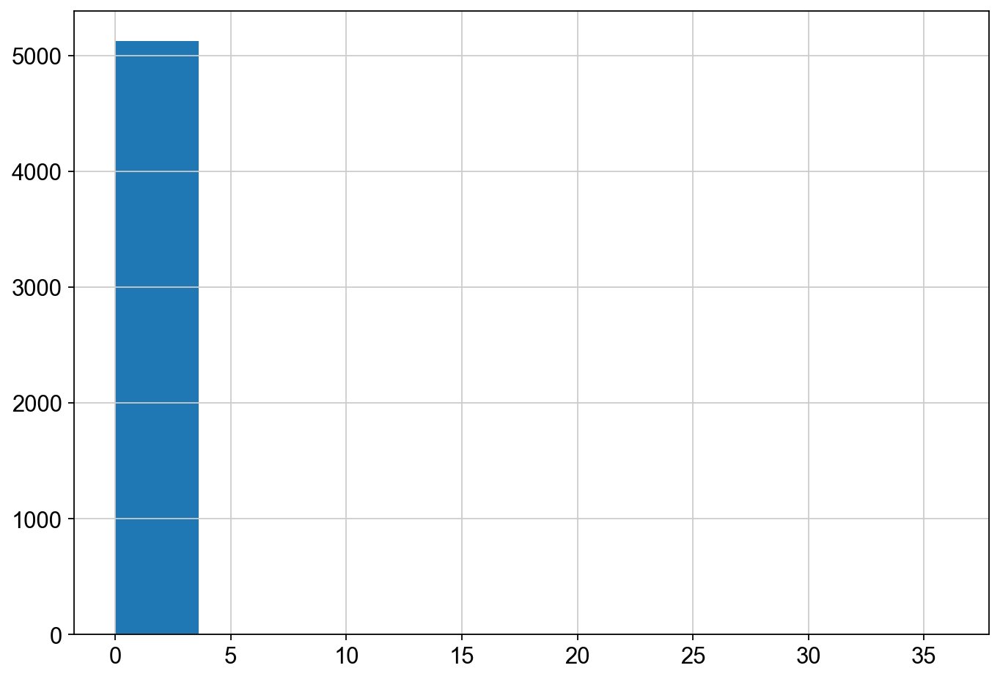

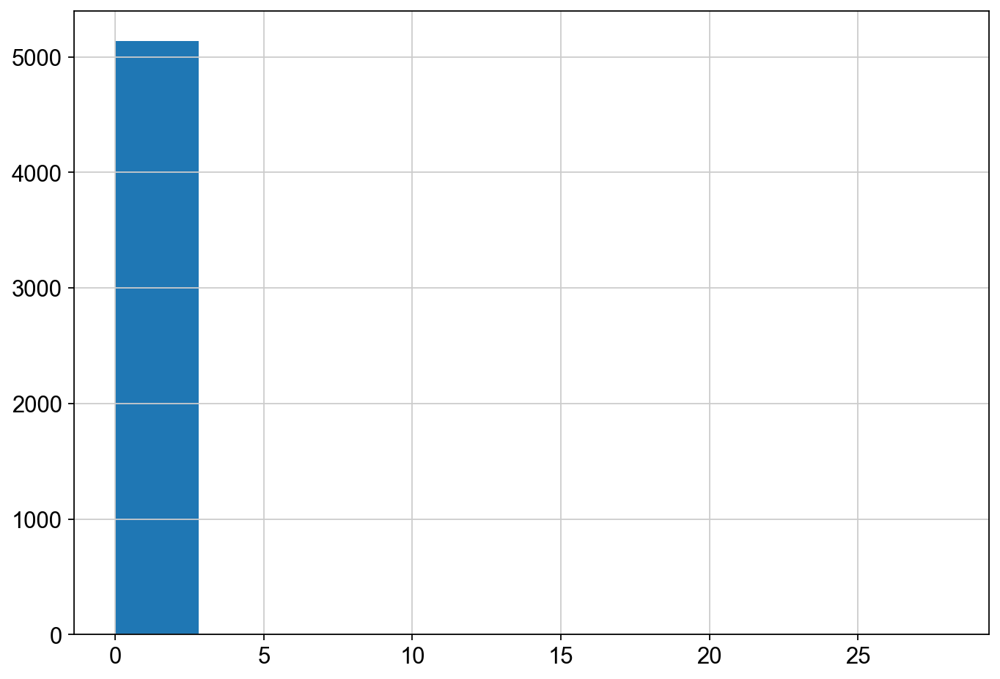

...

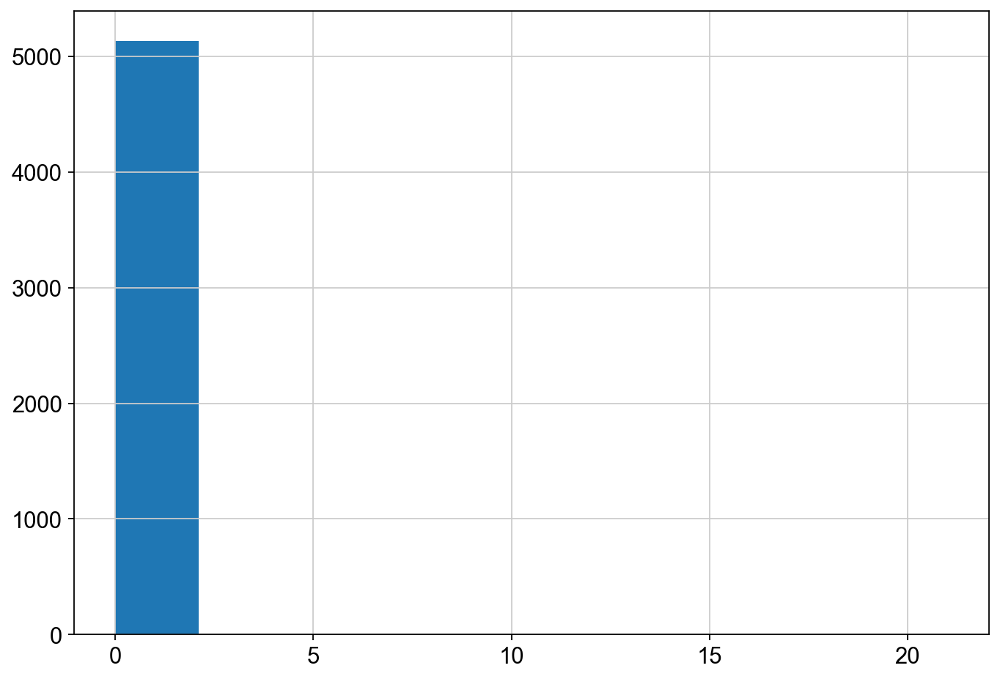

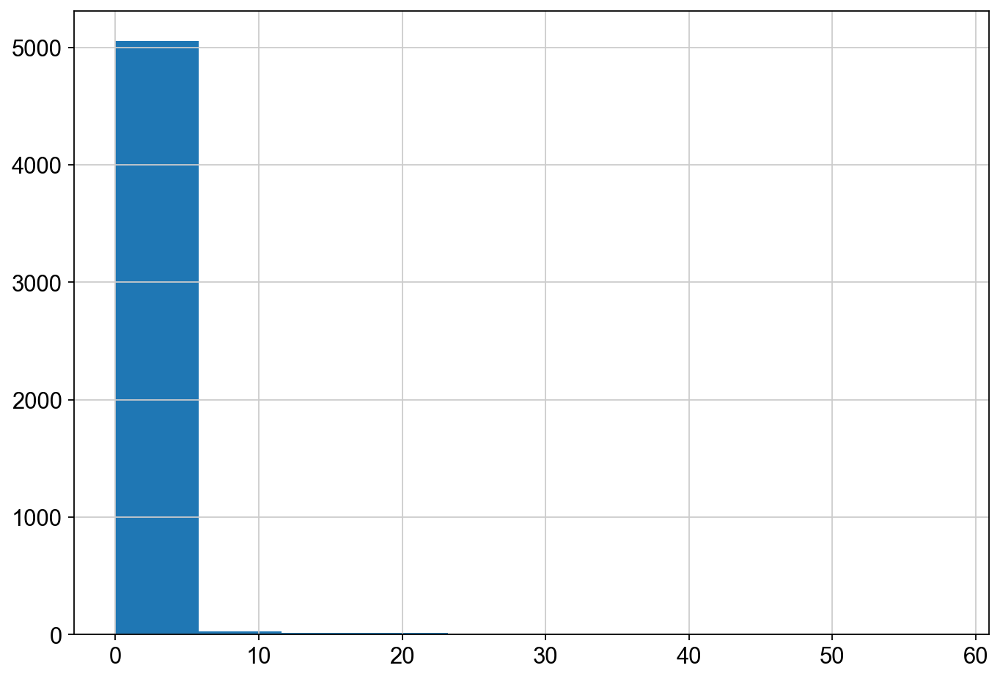

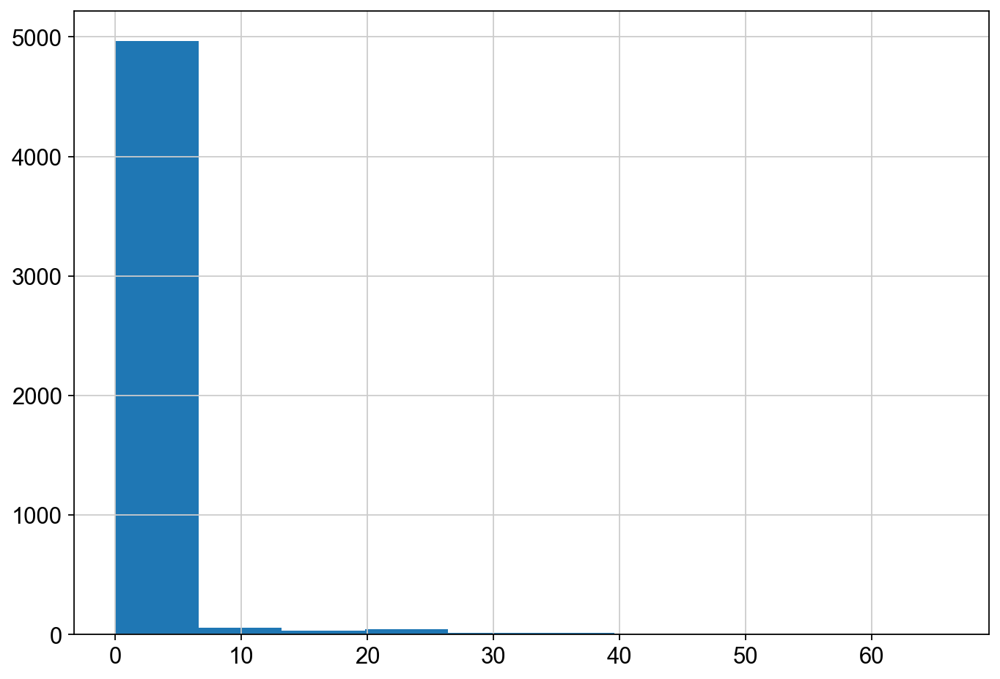

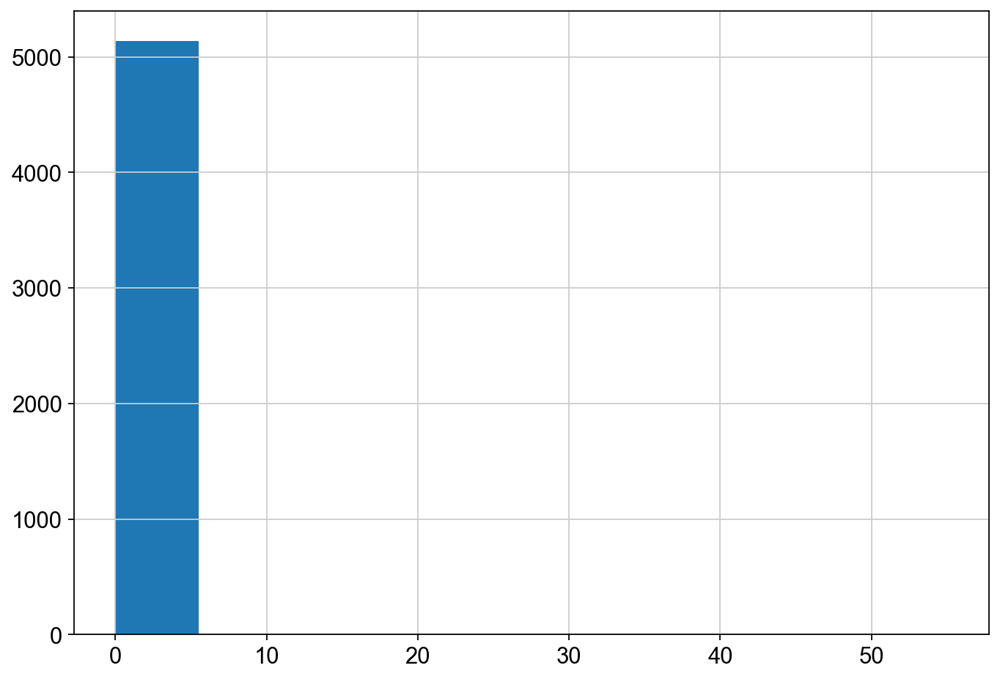

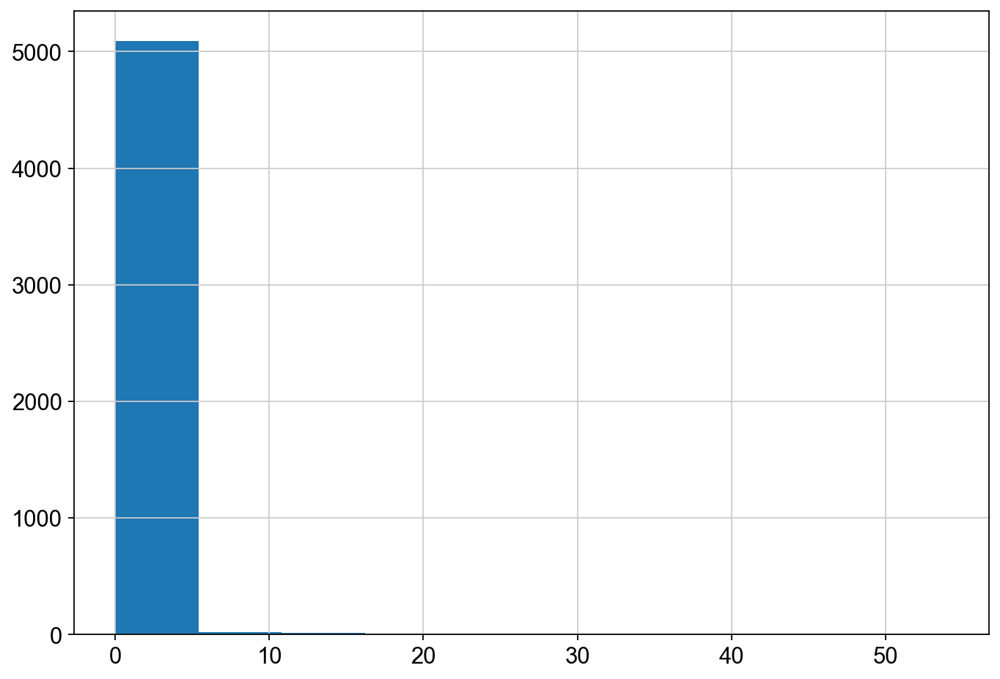

In [38]:
libraryToRemove=[]
for x in library:
    fig, ax = plt.subplots(figsize =(10, 7))
    ax.hist(adata.X[:,adata.var.index.isin([x])].toarray())
    if x not in adata.var.index:
        libraryToRemove.append(x)
        continue
    adata.obs["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()
    hashCounts["%s-library" % x] = adata.X[:,adata.var.index.isin([x])].toarray()
print(libraryToRemove)
for x in libraryToRemove:
    library.remove(x)

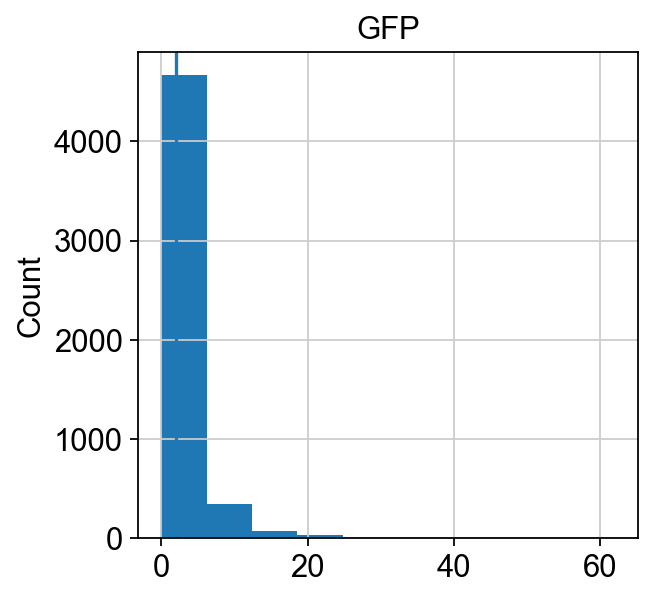

In [39]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'GFP'].X.toarray())
plt.ylabel("Count")
plt.title("GFP")
plt.axvline(x=2)
plt.show()

In [40]:
adata.obs['GFP_count'] = adata.X[:,adata.var.index.isin(['GFP'])].toarray()

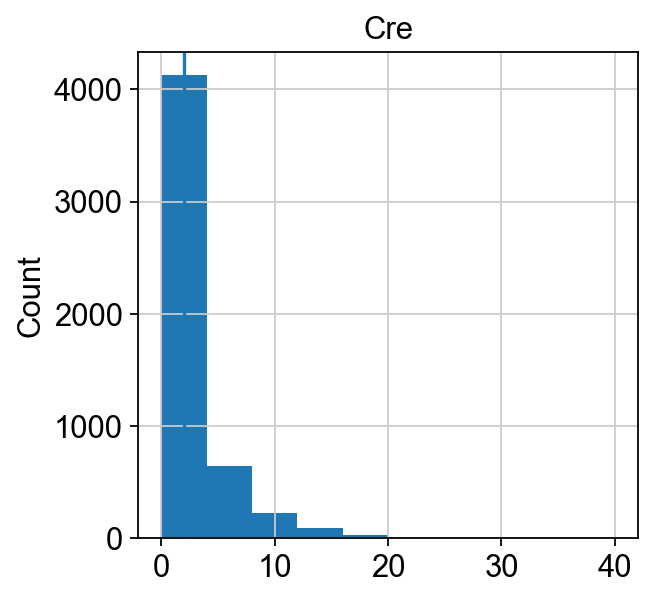

In [41]:
import matplotlib.pyplot as plt
_ = plt.hist(adata[adata.obs.index,'Cre'].X.toarray())
plt.ylabel("Count")
plt.title("Cre")
plt.axvline(x=2)
plt.show()

In [42]:
adata.obs['Cre_count'] = adata.X[:,adata.var.index.isin(['Cre'])].toarray()

## find single library read cells

In [43]:
hashIDs = hashCounts.copy()
for hashName in hashCounts.columns:
    print(hashName)
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
hashIDs

1660-Fosl2.752-library
1661-Fhl2.467-library
1663-Myc.989-library
1665-Yap1.735-library
1667-Atf4.1383-library
1671-Nfkb2.152-library
1673-Relb.286-library
1676-Onecut2.2361-library
1811-Itga2.672-library
1999-Cldn4-951-library
2114-Lif.1890-library
2115-Fosl1.1401-library
2118-Nfkb1.3737-library
shRenilla-library


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/95768847.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False  True]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/95768847.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] >= 2
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/95768847.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ...

,1660-Fosl2.752-library,1661-Fhl2.467-library,1663-Myc.989-library,1665-Yap1.735-library,1667-Atf4.1383-library,1671-Nfkb2.152-library,1673-Relb.286-library,1676-Onecut2.2361-library,1811-Itga2.672-library,1999-Cldn4-951-library,2114-Lif.1890-library,2115-Fosl1.1401-library,2118-Nfkb1.3737-library,shRenilla-library
AAACCCAGTCCAGAAG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCTAGCATG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCTCCGAGG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACGAAAGTGGACGT-1,False,False,True,False,False,False,False,False,False,False,False,False,False,False
AAACGAACAACAGCCC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGAGGGTAGCT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGAGTTACGAA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGGTGACAGCA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGTCCATTGCC-1,False,False,False,False,False,False,False,True,False,False,False,False,False,False


In [44]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashCounts.columns[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [45]:
adata.obs["library_id"] = classification
adata.obs["library_id"].value_counts()

library_id
negative                     3651
1673-Relb.286-library         322
1676-Onecut2.2361-library     290
2115-Fosl1.1401-library       226
1663-Myc.989-library          142
2114-Lif.1890-library         133
1660-Fosl2.752-library        103
shRenilla-library              73
1671-Nfkb2.152-library         72
1665-Yap1.735-library          34
1811-Itga2.672-library         32
1999-Cldn4-951-library         19
1661-Fhl2.467-library          17
2118-Nfkb1.3737-library        15
1667-Atf4.1383-library         13
doublet                         7
Name: count, dtype: int64

## Prune filtered cells and run hashing on extra hashtag reads

In [46]:
adata_enriched = sc.read_10x_h5('../barcodes/FECopy/Lib2_F_ECopy_BC_enriched_filtered_feature_bc_matrix.h5')

reading ../barcodes/FECopy/Lib2_F_ECopy_BC_enriched_filtered_feature_bc_matrix.h5
 (0:00:00)


In [47]:
# Find the barcodes that exist in BOTH datasets
common_indices = adata_enriched.obs.index.intersection(adata.obs.index)

# Filter the enriched data to only include those common cells and the specific tags
adata_enriched = adata_enriched[common_indices, tags]

In [48]:
hashCounts = pd.DataFrame(adata_enriched.X.todense(), columns=adata_enriched.var_names, index=adata_enriched.obs.index)
hashDisc = hashCounts.describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,0.95,0.99,0.999])
hashCounts

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAGTCCAGAAG-1,10.0,8.0,20.0,66.0,70.0,2.0,47.0,5.0,1.0,17.0,151.0,82.0,18.0,7.0,59.0,61.0,7.0
AAACCCATCTAGCATG-1,18.0,19.0,55.0,129.0,146.0,8.0,104.0,12.0,2.0,57.0,339.0,179.0,28.0,15.0,120.0,161.0,12.0
AAACCCATCTCCGAGG-1,32.0,23.0,68.0,155.0,152.0,8.0,106.0,14.0,3.0,54.0,402.0,240.0,34.0,21.0,240.0,176.0,11.0
AAACGAAAGTGGACGT-1,24.0,14.0,41.0,143.0,125.0,12.0,130.0,17.0,3.0,67.0,334.0,169.0,27.0,16.0,105.0,143.0,11.0
AAACGAACAACAGCCC-1,11.0,10.0,23.0,66.0,63.0,4.0,48.0,8.0,3.0,17.0,153.0,68.0,14.0,4.0,54.0,63.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAATACGCT-1,17.0,14.0,43.0,108.0,107.0,11.0,79.0,14.0,3.0,43.0,274.0,134.0,21.0,10.0,98.0,128.0,3.0
TTTGGTTGTCCACTCT-1,21.0,9.0,26.0,112.0,84.0,8.0,74.0,7.0,2.0,26.0,304.0,87.0,20.0,12.0,66.0,88.0,5.0
TTTGTTGAGGGTAGCT-1,17.0,11.0,21.0,68.0,55.0,7.0,44.0,11.0,0.0,28.0,136.0,76.0,20.0,8.0,61.0,74.0,6.0
TTTGTTGGTGACAGCA-1,22.0,13.0,33.0,80.0,86.0,9.0,80.0,7.0,2.0,38.0,198.0,101.0,21.0,12.0,67.0,76.0,9.0


In [49]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(hashDisc.loc["90%",hashName])
    hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
#hashIDs

shRenilla_TGTCTAGT
37.0
shRenilla_CATAGTCA
27.0
shPatch_GTACTTGC
77.0
shPatch_CCATTACT
218.20000000000027
1660-Fosl2.752_CGGGAATG
204.0
1661-Fhl2.467_GCCTACGT
17.0
1663-Myc.989_CTGAATCT
158.0
1665-Yap1.735_CGTTAGGG
28.0
1667-Atf4.1383_TCTGGGGC
8.0
1671-Nfkb2.152_CGTTCAAG
76.0
1673-Relb.286_ACAGAGCC
532.0
1676-Onecut2.2361_TTAATTAG
271.2000000000003
1811-Itga2.672_GCCAATCG
42.0
1999-Cldn4-951_CGTTTCCT
24.0
2114-Lif.1890_ACACGTGA
180.0
2115-Fosl1.1401_GGTAGGGA
232.0
2118-Nfkb1.3737_CAGTGCAT
17.0


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = hashCounts.loc[:,hashName] > hashDisc.loc["90%",hashName]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/420048964.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in 

In [50]:
classification = np.empty(len(adata), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

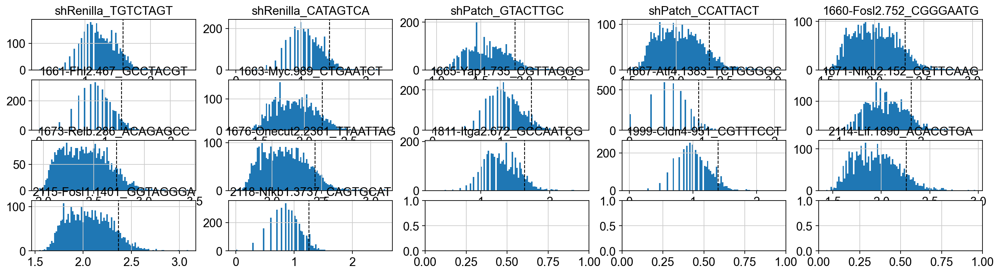

In [51]:
plt.rcParams['figure.figsize'] = (4,4)
fig, axs = plt.subplots(4,5, figsize =(20, 5))

for i, hashName in enumerate(adata_enriched.var_names):
    hashCounts2 = np.log10(hashCounts[hashName]+1)
    axs[i//5,i%5].set_title(hashName)
    axs[i//5,i%5].hist(hashCounts2, bins = 100)
    axs[i//5,i%5].axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)

#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

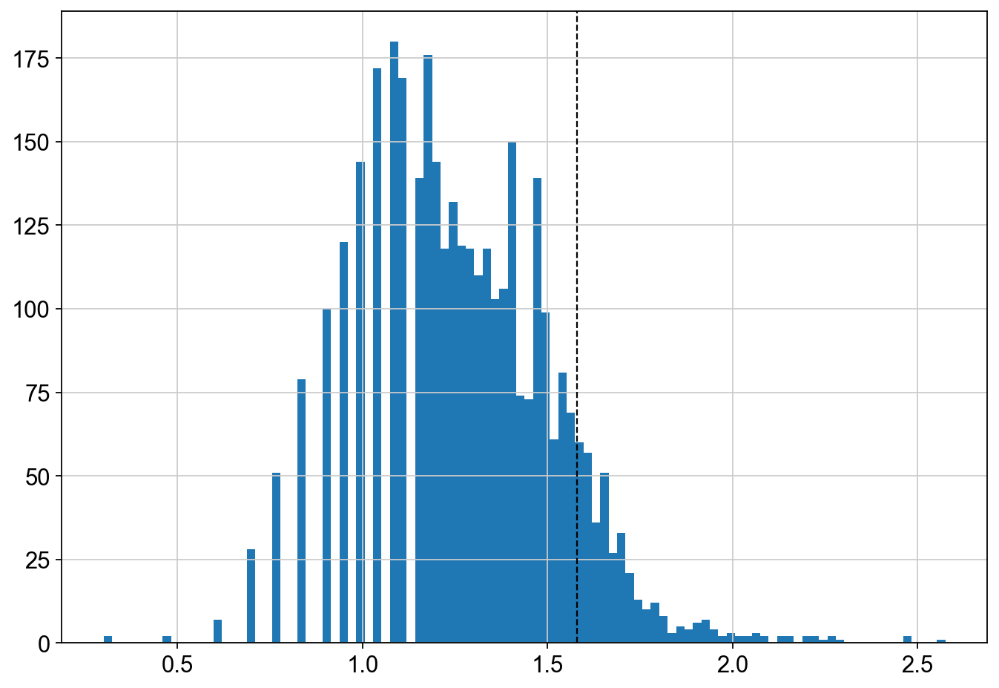

In [52]:
hashName= "shRenilla_TGTCTAGT"
hash301 = np.log10(hashCounts[hashName]+1)

fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(hash301, bins = 100)
ax.axvline(np.log10(int(hashDisc.loc["90%",hashName])+1), color='k', linestyle='dashed', linewidth=1)
# Show plot
plt.show()

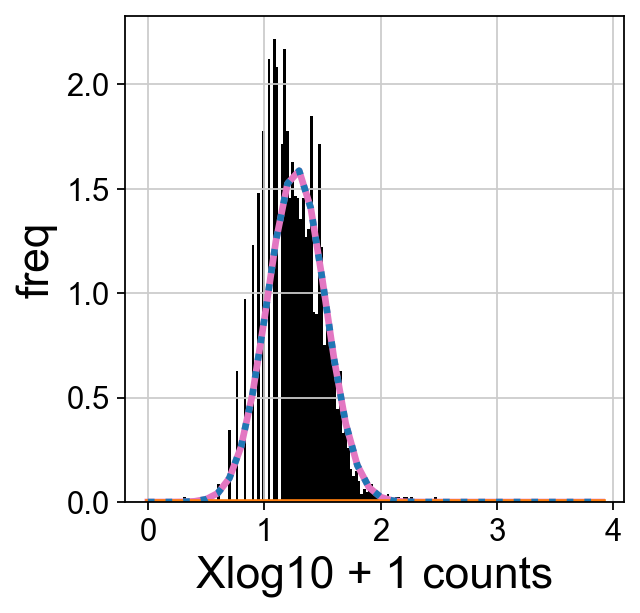

In [53]:
# import libraries (some are for cosmetics)
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
from scipy.stats import norm
from sklearn.mixture import GaussianMixture as GMM
import matplotlib as mpl

x = np.array(hash301).reshape(-1, 1)

# create GMM model object
gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, weights_init=[0.9,0.1], means_init=[[2],[4]])

# find useful parameters
fitGMM = gmm.fit(x)
mean = fitGMM.means_  
covs  = fitGMM.covariances_
weights = fitGMM.weights_

# create necessary things to plot
x_axis = np.arange(0, 4, 0.1)
y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

ax = fig.add_subplot(1,2,2)
# Plot 2
plt.hist(x, density=True, color='black', bins=100)
plt.plot(x_axis, y_axis0, lw=3, c='C6')
plt.plot(x_axis, y_axis1, lw=3, c='C1')
plt.plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')
#plt.xlim(0, 4, 0.1)
#plt.ylim(0.0, 2.0)
plt.xlabel(r"Xlog10 + 1 counts", fontsize=20)
plt.ylabel(r"freq", fontsize=20)

#plt.subplots_adjust(wspace=0.3)
plt.show()
plt.close('all')

shRenilla_TGTCTAGT 1.2747846
shRenilla_CATAGTCA 1.1450015
shPatch_GTACTTGC 1.5919296
shPatch_CCATTACT 2.0362334
1660-Fosl2.752_CGGGAATG 2.0079734
1661-Fhl2.467_GCCTACGT 0.94250333
1663-Myc.989_CTGAATCT 1.8935992
1665-Yap1.735_CGTTAGGG 1.1454521
1667-Atf4.1383_TCTGGGGC 0.6317969
1671-Nfkb2.152_CGTTCAAG 1.5840662
1673-Relb.286_ACAGAGCC 2.4166234
1676-Onecut2.2361_TTAATTAG 2.1344159
1811-Itga2.672_GCCAATCG 1.3373204
1999-Cldn4-951_CGTTTCCT 1.083613
2114-Lif.1890_ACACGTGA 1.9517697
2115-Fosl1.1401_GGTAGGGA 2.064576
2118-Nfkb1.3737_CAGTGCAT 0.93947554


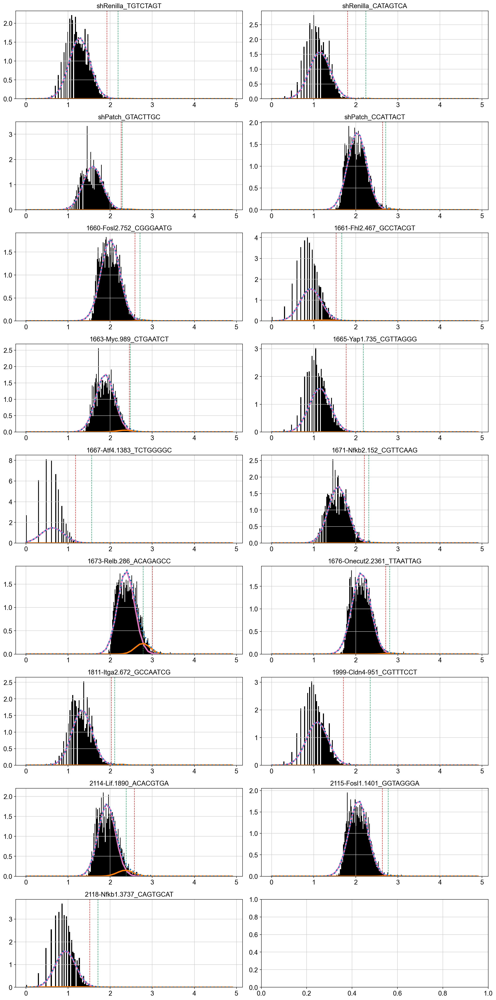

In [54]:
import pdb

fig, axs = plt.subplots(9,2, figsize =(15, 30))
dfHashBoundry = pd.DataFrame(np.zeros(len(adata_enriched.var_names)),adata_enriched.var_names, columns=["boundry"])
#gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.1],[4]])
binEx = np.arange(0,5,5/1000).reshape(-1,1)

for i, hashName in enumerate(adata_enriched.var_names):
    hashCount = np.array(np.log10(hashCounts[hashName]+1)).reshape(-1, 1)
    gmm = None
    print(hashName, hashCount.mean())
    if (hashCount.mean() > 2):
        gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[2.5],[3]])
    elif (hashCount.mean() > 1):
        gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[1.75],[3]])
    else:
        gmm = GMM(n_components = 2, random_state=10, covariance_type = 'full', n_init=5, means_init=[[0.5],[2]])
    fitGMM = gmm.fit(hashCount)
    mean = fitGMM.means_  
    covs  = fitGMM.covariances_
    weights = fitGMM.weights_

    fitGmmBound = fitGMM.predict(binEx)
    hashBoundary = False # look for where the transition starts
    if fitGmmBound[0] == 0:
        if np.where(fitGmmBound == 1)[0].size == 0:
            #set hashBoundry to naiveBoundry if there is no second Gaussian
            hashBoundry = np.log10(int(hashDisc.loc["95%",hashName])+1)
        else:
            hashBoundry = binEx[np.where(fitGmmBound == 1)[0][0]][0]            
            #hashBoundry = binEx[(np.where(fitGMM.predict_proba(binEx)[:,1] > .99) and np.where(fitGMM.predict_proba(binEx)[:,0] < 1e-3))[0][0]][0]
            #print(np.where(fitGMM.predict_proba(binEx)[:,1] > .99)[0][0])
           
    else:
        count = False
        for x in range(0,len(fitGmmBound)):
            if not count and fitGmmBound[x] != 0:
                continue
            elif fitGmmBound[x] == 0:
                count = x
            elif count and fitGmmBound[x] == 1:# and fitGMM.predict_proba(binEx)[x][1] > .99 and fitGMM.predict_proba(binEx)[x][0] < 1e-3:
                hashBoundry = binEx[x][0]
                #pdb.set_trace()
                break
#    hashBoundry = mean[0][0]+1.96*np.sqrt(float(covs[0][0][0]))
    naiveBoundry = np.log10(int(hashDisc.loc["99%",hashName])+1)
    
    dfHashBoundry.loc[hashName] = hashBoundry
    
    x_axis = np.arange(0, 5, 0.1)
    y_axis0 = norm.pdf(x_axis, float(mean[0][0]), np.sqrt(float(covs[0][0][0])))*weights[0] # 1st gaussian
    y_axis1 = norm.pdf(x_axis, float(mean[1][0]), np.sqrt(float(covs[1][0][0])))*weights[1] # 2nd gaussian

    # Plot 2
    axs[i//2,i%2].set_title(hashName)
    axs[i//2,i%2].axvline(hashBoundry, c='C2', linestyle='dashed', linewidth=1)  #green #test making it stricter
    axs[i//2,i%2].axvline(naiveBoundry, c='C3', linestyle='dashed', linewidth=1) #red
    axs[i//2,i%2].hist(hashCount, density=True, color='black', bins=100)        
    axs[i//2,i%2].plot(x_axis, y_axis0, lw=3, c='C6')                            #pink
    axs[i//2,i%2].plot(x_axis, y_axis1, lw=3, c='C1')                            #orange
    axs[i//2,i%2].plot(x_axis, y_axis0+y_axis1, lw=3, c='C0', ls=':')            #dotted blue
    
plt.tight_layout(pad=1.0)
#plt.rcParams["figure.figsize"] = (20,5)
plt.show()

In [55]:
#dfHashBoundry += 0.1
dfHashBoundry

,boundry
shRenilla_TGTCTAGT,2.185
shRenilla_CATAGTCA,2.240
shPatch_GTACTTGC,2.285
shPatch_CCATTACT,2.710
1660-Fosl2.752_CGGGAATG,2.710
1661-Fhl2.467_GCCTACGT,1.665
1663-Myc.989_CTGAATCT,2.480
1665-Yap1.735_CGTTAGGG,2.180
1667-Atf4.1383_TCTGGGGC,1.560
1671-Nfkb2.152_CGTTCAAG,2.310


In [56]:
hashIDs = hashCounts.copy()
hashID = adata_enriched.var_names
for hashName in adata_enriched.var_names:
    print(hashName)
    print(dfHashBoundry.loc[hashName].values[0])
    hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
hashIDs

shRenilla_TGTCTAGT
2.185
shRenilla_CATAGTCA
2.24
shPatch_GTACTTGC
2.285
shPatch_CCATTACT
2.71
1660-Fosl2.752_CGGGAATG
2.71
1661-Fhl2.467_GCCTACGT
1.665
1663-Myc.989_CTGAATCT
2.48
1665-Yap1.735_CGTTAGGG
2.18
1667-Atf4.1383_TCTGGGGC
1.56
1671-Nfkb2.152_CGTTCAAG
2.31
1673-Relb.286_ACAGAGCC
2.785
1676-Onecut2.2361_TTAATTAG
2.805
1811-Itga2.672_GCCAATCG
2.11
1999-Cldn4-951_CGTTTCCT
2.345
2114-Lif.1890_ACACGTGA
2.38
2115-Fosl1.1401_GGTAGGGA
2.77
2118-Nfkb1.3737_CAGTGCAT
1.71


/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/68405080.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/68405080.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[False False False ... False False False]' has dtype incompatible with float32, please explicitly cast to a compatible dtype first.
  hashIDs.loc[:,hashName] = np.log10(hashCounts.loc[:,hashName]+1) > dfHashBoundry.loc[hashName].values[0]
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/68405080.py:6: FutureWarning: Setting an item of incompatible

,shRenilla_TGTCTAGT,shRenilla_CATAGTCA,shPatch_GTACTTGC,shPatch_CCATTACT,1660-Fosl2.752_CGGGAATG,1661-Fhl2.467_GCCTACGT,1663-Myc.989_CTGAATCT,1665-Yap1.735_CGTTAGGG,1667-Atf4.1383_TCTGGGGC,1671-Nfkb2.152_CGTTCAAG,1673-Relb.286_ACAGAGCC,1676-Onecut2.2361_TTAATTAG,1811-Itga2.672_GCCAATCG,1999-Cldn4-951_CGTTTCCT,2114-Lif.1890_ACACGTGA,2115-Fosl1.1401_GGTAGGGA,2118-Nfkb1.3737_CAGTGCAT
AAACCCAGTCCAGAAG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCTAGCATG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACCCATCTCCGAGG-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False
AAACGAAAGTGGACGT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
AAACGAACAACAGCCC-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAATACGCT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGGTTGTCCACTCT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGAGGGTAGCT-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
TTTGTTGGTGACAGCA-1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [57]:
classification = np.empty(len(adata_enriched), dtype="object")
i = 0
for cellBar, hashBool in hashIDs.iterrows():
    #print(i)
    #print(hashBool)
    #print(hashBool.values)
    #print(sum(hashBool))
    numHashes = sum(hashBool)
    if (numHashes == 1):
        classif = hashID[hashBool.values].values[0]
    elif (numHashes > 1):
        classif = "doublet"
    else:
        classif = "negative"
    classification[i] = classif
    i = i + 1
    #break

In [58]:
adata_enriched.obs['Library'] = classification
adata.obs["Library"] = adata_enriched.obs['Library']
adata.obs["Library"].value_counts()

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/2727749959.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_enriched.obs['Library'] = classification


Library
negative                    3226
1673-Relb.286_ACAGAGCC       110
doublet                       99
2114-Lif.1890_ACACGTGA        48
1811-Itga2.672_GCCAATCG       16
shPatch_GTACTTGC              15
1661-Fhl2.467_GCCTACGT         9
shRenilla_TGTCTAGT             8
2118-Nfkb1.3737_CAGTGCAT       7
shPatch_CCATTACT               6
1663-Myc.989_CTGAATCT          6
1667-Atf4.1383_TCTGGGGC        6
1671-Nfkb2.152_CGTTCAAG        5
shRenilla_CATAGTCA             3
1665-Yap1.735_CGTTAGGG         2
1999-Cldn4-951_CGTTTCCT        1
2115-Fosl1.1401_GGTAGGGA       1
1660-Fosl2.752_CGGGAATG        1
Name: count, dtype: int64

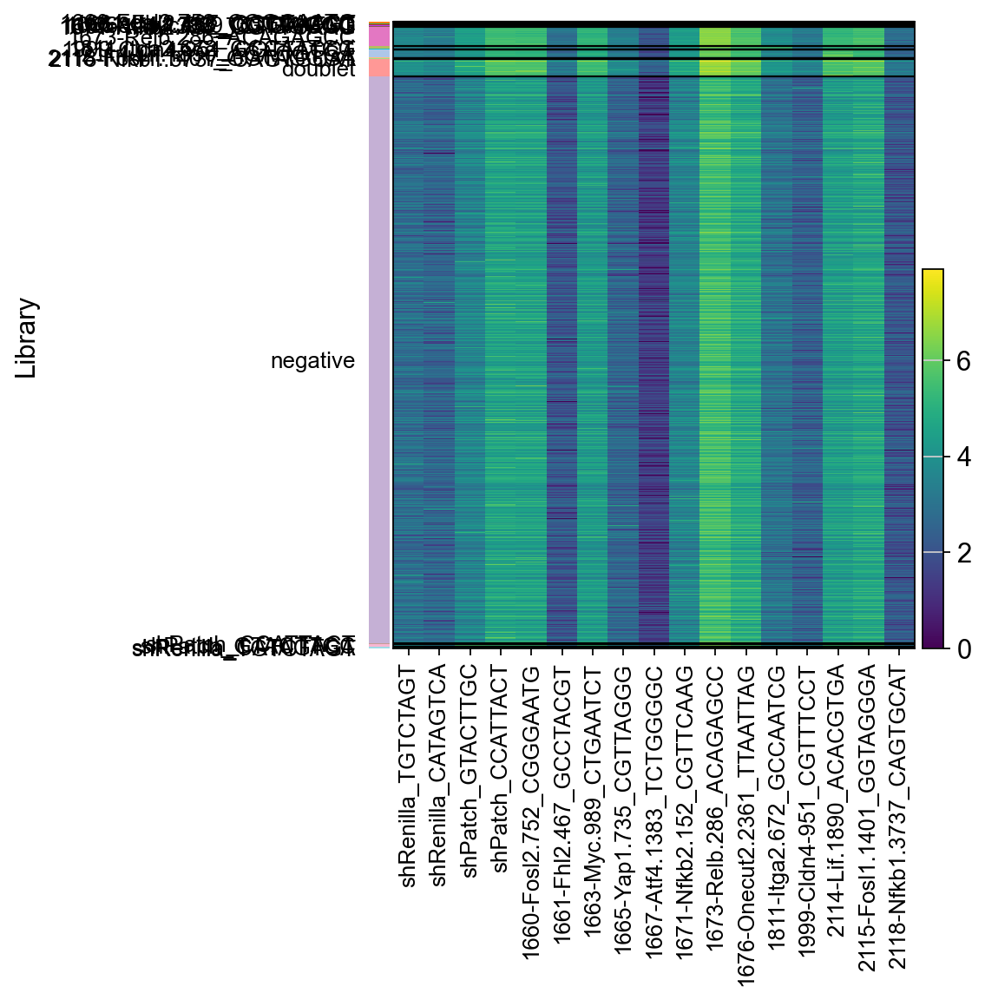

In [59]:
#output visulaization of hashing
sc.pl.heatmap(adata_enriched, adata_enriched.var_names, groupby="Library", log=True)#, save = f"_{figName}_hash.png")

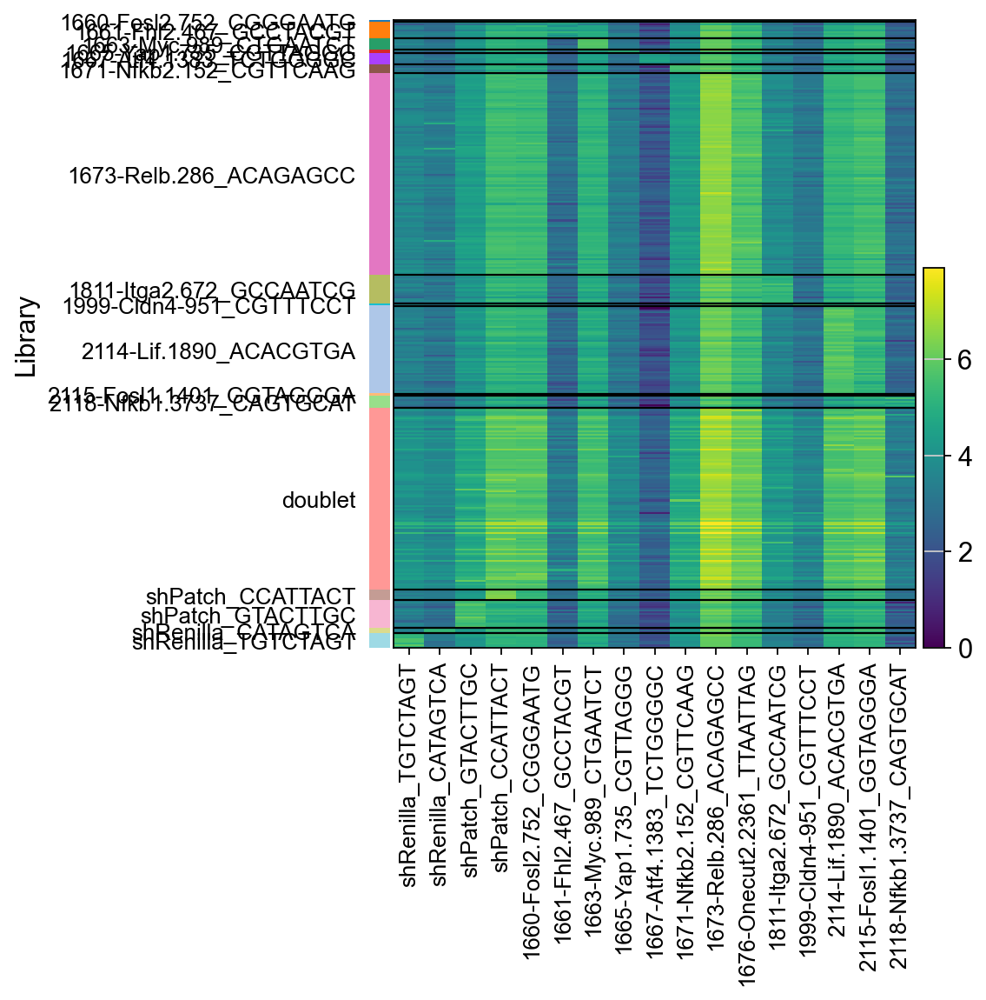

In [60]:
#output visulaization of hashing
sc.pl.heatmap(adata_enriched[~adata_enriched.obs.Library.isin(['negative']),:], adata_enriched.var_names, groupby="Library", log=True)#, save = f"_{figName}_hash.png")

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

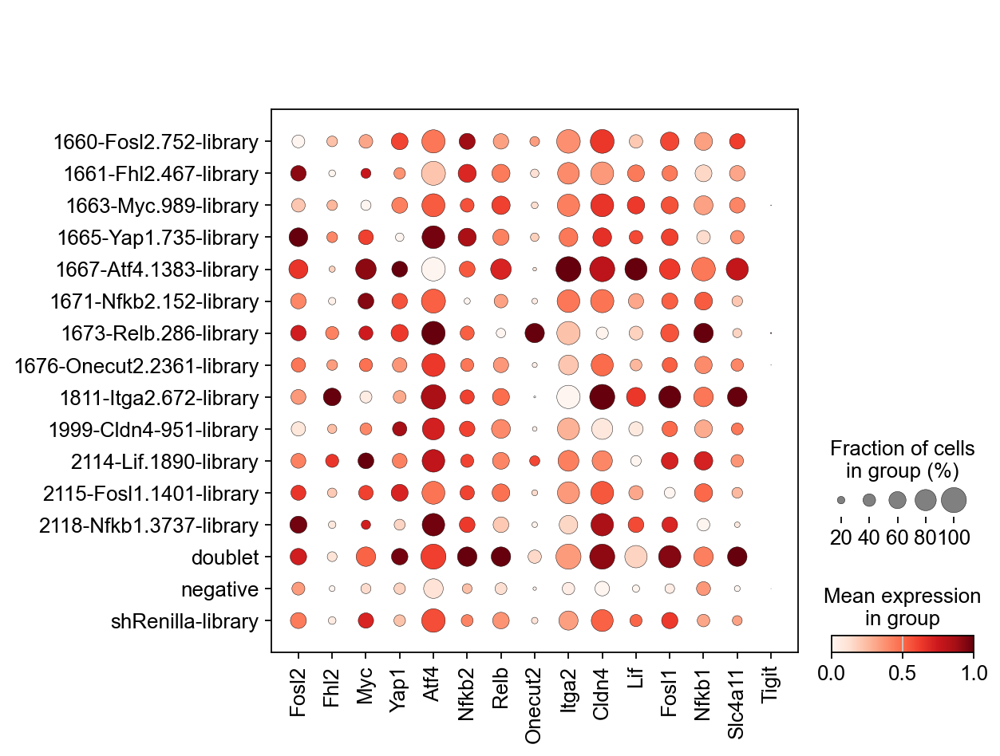

In [61]:
sc.pl.dotplot(adata, targetGenes, groupby='library_id', standard_scale='var')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

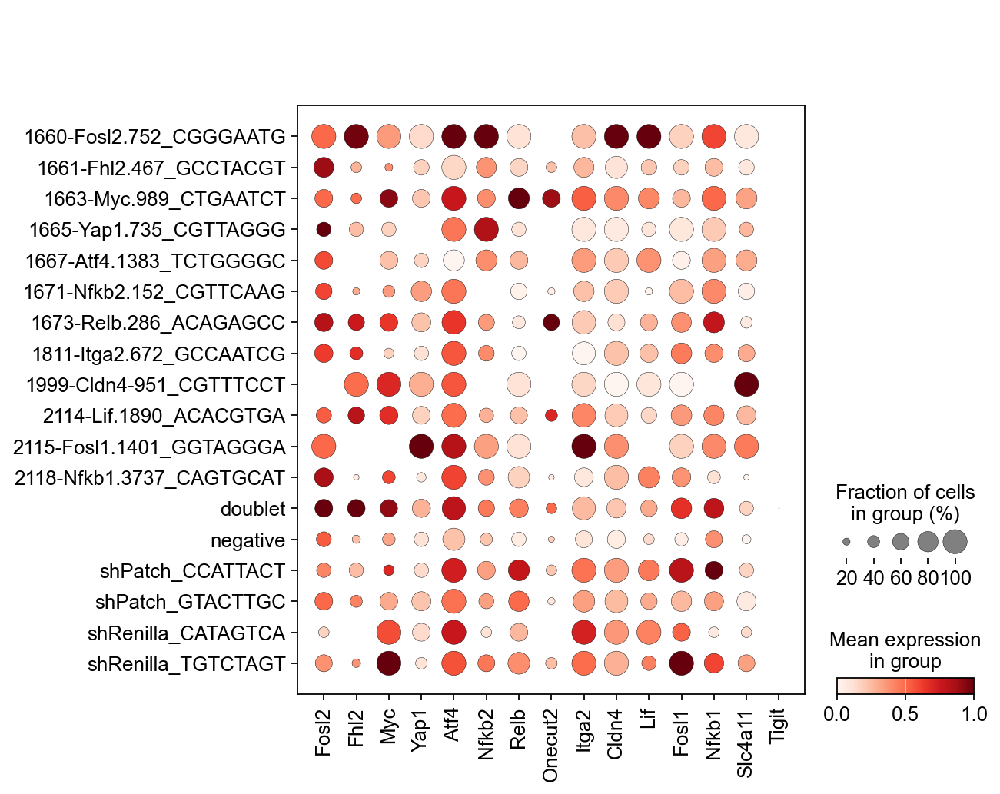

In [62]:
sc.pl.dotplot(adata, targetGenes, groupby='Library', standard_scale='var')

In [63]:
adata.obs.Library.value_counts()

Library
negative                    3226
1673-Relb.286_ACAGAGCC       110
doublet                       99
2114-Lif.1890_ACACGTGA        48
1811-Itga2.672_GCCAATCG       16
shPatch_GTACTTGC              15
1661-Fhl2.467_GCCTACGT         9
shRenilla_TGTCTAGT             8
2118-Nfkb1.3737_CAGTGCAT       7
1663-Myc.989_CTGAATCT          6
1667-Atf4.1383_TCTGGGGC        6
shPatch_CCATTACT               6
1671-Nfkb2.152_CGTTCAAG        5
shRenilla_CATAGTCA             3
1665-Yap1.735_CGTTAGGG         2
1660-Fosl2.752_CGGGAATG        1
1999-Cldn4-951_CGTTTCCT        1
2115-Fosl1.1401_GGTAGGGA       1
Name: count, dtype: int64

In [64]:
adata.obs.library_id.value_counts()

library_id
negative                     3651
1673-Relb.286-library         322
1676-Onecut2.2361-library     290
2115-Fosl1.1401-library       226
1663-Myc.989-library          142
2114-Lif.1890-library         133
1660-Fosl2.752-library        103
shRenilla-library              73
1671-Nfkb2.152-library         72
1665-Yap1.735-library          34
1811-Itga2.672-library         32
1999-Cldn4-951-library         19
1661-Fhl2.467-library          17
2118-Nfkb1.3737-library        15
1667-Atf4.1383-library         13
doublet                         7
Name: count, dtype: int64

In [65]:
import re
m = re.compile("(.+\-|negative|doublet)")

In [66]:
i=0
for x, y in adata.obs[['library_id', 'Library']].iterrows():
    print(y)
    i+=1
    if i == 1: 
        library_id,Library = y
        print(library_id[:-8])
        break

library_id    negative
Library       negative
Name: AAACCCAGTCCAGAAG-1, dtype: object



In [67]:
classification = np.empty(len(adata), dtype="object")
i=0
import re
m1 = re.compile("(.+\-library|negative|doublet)")
m2 = re.compile("(.+\_)|negative|doublet")
for x,y in adata.obs[['library_id', 'Library']].iterrows():
    library_id,Library = y
    m1match = m1.match(library_id)
    if pd.isna(Library): 
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        classification[i] = m1match
    elif m1.match(library_id) and m2.match(Library):
        m2match = m2.match(Library)
        if m1match.group(0)[-8:] == "-library":
            m1match = m1match.group(0)[:-8]
        else:
            m1match = m1match.group(0)
        if m2match.group(0)[-1] == "_":
            m2match = m2match.group(0)[:-1]
        else:
            m2match = m2match.group(0)
        if m1match == m2match:
            classification[i] = m1match
        elif m1match == 'doublet' or m2match == 'doublet':
            classification[i] = 'doublet'
        elif m1match == 'negative':
            classification[i] = m2match
        elif m2match == 'negative':
            classification[i] = m1match
        else:
            classification[i] = 'mismatch'
    i += 1
adata.obs['cLibrary'] = classification

In [68]:
adata.obs.cLibrary.value_counts()

cLibrary
negative             3544
1673-Relb.286         331
1676-Onecut2.2361     268
2115-Fosl1.1401       216
1663-Myc.989          140
2114-Lif.1890         134
doublet               106
1660-Fosl2.752         98
shRenilla              72
1671-Nfkb2.152         72
1811-Itga2.672         33
1665-Yap1.735          31
mismatch               23
shPatch                21
1999-Cldn4-951         18
1661-Fhl2.467          16
2118-Nfkb1.3737        13
1667-Atf4.1383         13
Name: count, dtype: int64

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:168: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:178: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored

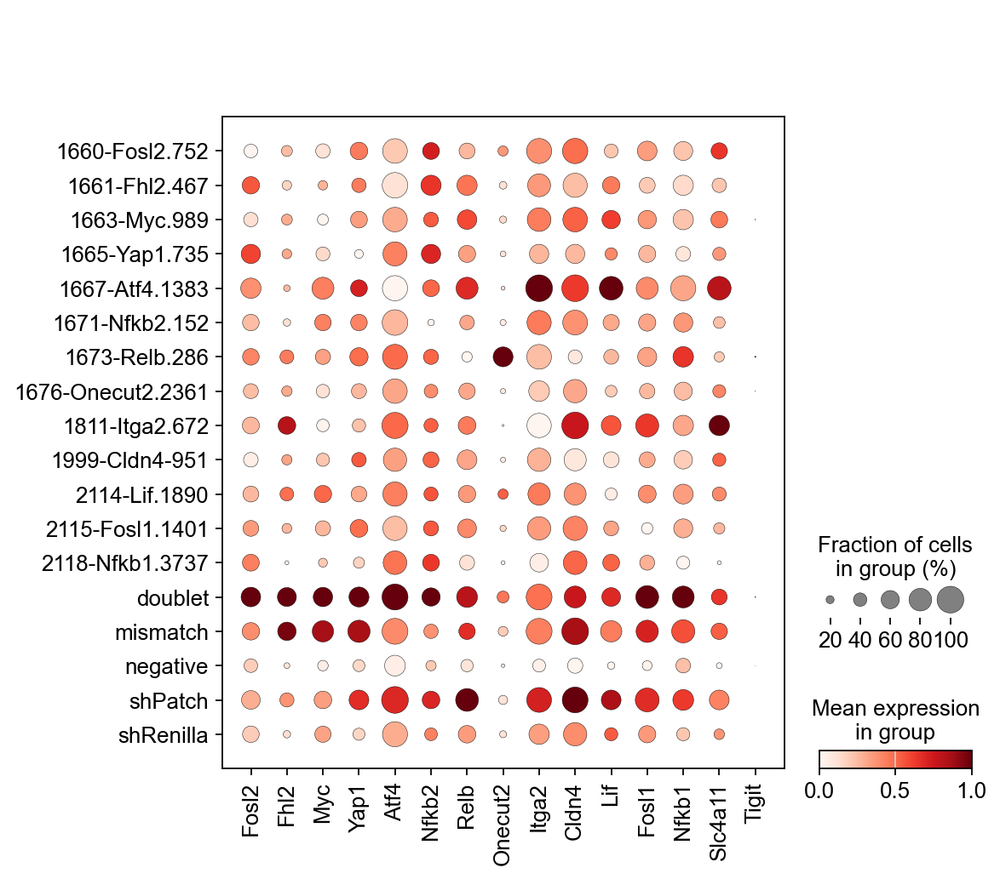

In [69]:
sc.pl.dotplot(adata, targetGenes, groupby='cLibrary', standard_scale='var')

## Set highly variable genes

In [70]:
adata = adata[~(adata.obs['Classification'].isin(['doublet','negative'])|adata.obs['library_id'].isin(['doublet'])),:]

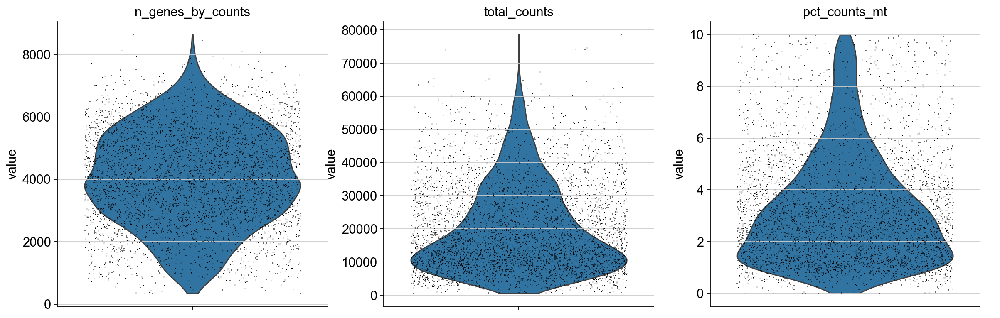

In [71]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, rotation=90)

In [72]:
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


Logarithmize the data:

In [73]:
sc.pp.log1p(adata)

In [74]:
sc.pp.highly_variable_genes(adata) #batch_key=Classification

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


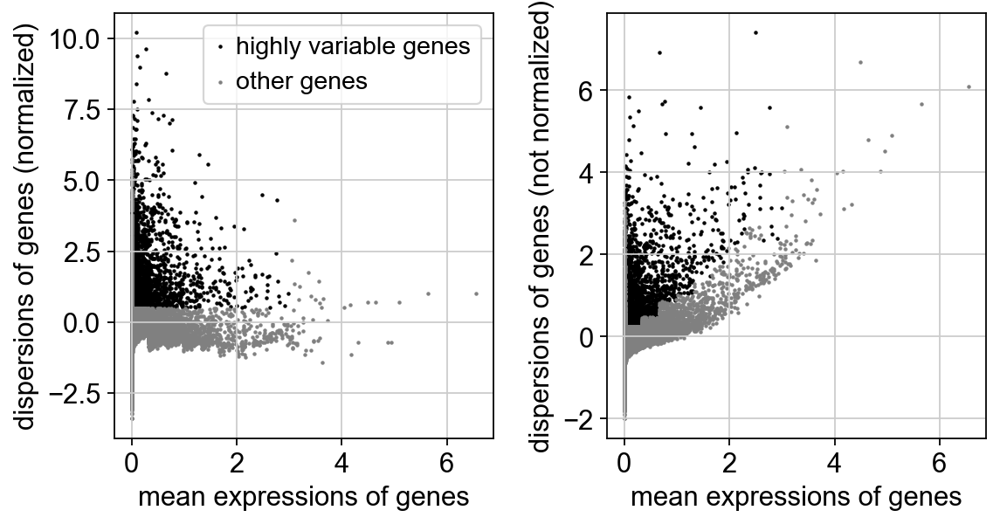

In [75]:
sc.pl.highly_variable_genes(adata)

In [76]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/2494002

In [77]:
adata.obs['library_id'].value_counts()

library_id
negative                     2627
1673-Relb.286-library         284
1676-Onecut2.2361-library     269
2115-Fosl1.1401-library       212
1663-Myc.989-library          136
2114-Lif.1890-library         114
1660-Fosl2.752-library         98
shRenilla-library              69
1671-Nfkb2.152-library         67
1665-Yap1.735-library          31
1811-Itga2.672-library         30
1999-Cldn4-951-library         17
1661-Fhl2.467-library          16
2118-Nfkb1.3737-library        14
1667-Atf4.1383-library         13
Name: count, dtype: int64

In [78]:
#Set shRNA groups
adata.obs['shRNA'] = None
for x in adata.obs["library_id"].cat.categories:
    if x == 'negative':continue
    adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/2310838860.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.obs['shRNA'][adata[adata.obs['library_id'].isin([x]),:].obs.index] = x
/var/folders/xc/wjwqs2j55dqgp2ghrn6n

In [79]:
adata.obs[['Classification','shRNA']].value_counts()

Classification  shRNA                    
AO1831_B0303    1673-Relb.286-library        218
AQ1128_B0304    1676-Onecut2.2361-library    212
AO1831_B0303    2115-Fosl1.1401-library      101
AQ1128_B0304    2115-Fosl1.1401-library       83
                1663-Myc.989-library          61
                1660-Fosl2.752-library        48
AQ1613_B0301    2114-Lif.1890-library         45
AQ1128_B0304    2114-Lif.1890-library         42
                shRenilla-library             42
AQ1613_B0301    1676-Onecut2.2361-library     41
AQ1128_B0304    1673-Relb.286-library         39
AQ1613_B0301    1663-Myc.989-library          36
AQ1128_B0304    1671-Nfkb2.152-library        36
AO1831_B0303    1660-Fosl2.752-library        30
AQ1128_B0304    1811-Itga2.672-library        29
AQ1613_B0301    1673-Relb.286-library         25
AO1831_B0303    1663-Myc.989-library          24
AQ1613_B0301    1671-Nfkb2.152-library        21
                shRenilla-library             21
                1660-Fosl2.

In [80]:
sum(adata.obs[['Classification','shRNA']].value_counts())

1370

In [81]:
adata.raw = adata

In [82]:
adata.write('write/allmice-noSCT.h5ad', compression='gzip')

In [83]:
adata = sc.read('write/allmice-noSCT.h5ad')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [84]:
adata = adata[:, adata.var.highly_variable]

In [85]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:13)


In [86]:
sc.pp.scale(adata, max_value=10)

## Principal component analysis

In [87]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=100)

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:00)


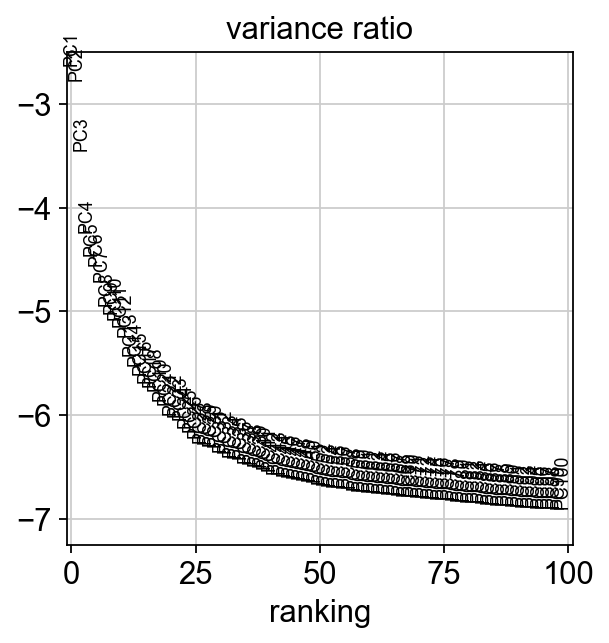

In [88]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100)

Save the result.

In [89]:
adata.write(results_file, compression='gzip')

In [90]:
adata

AnnData object with n_obs × n_vars = 3997 × 2961
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

In [91]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


## Embedding the neighborhood graph

In [92]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


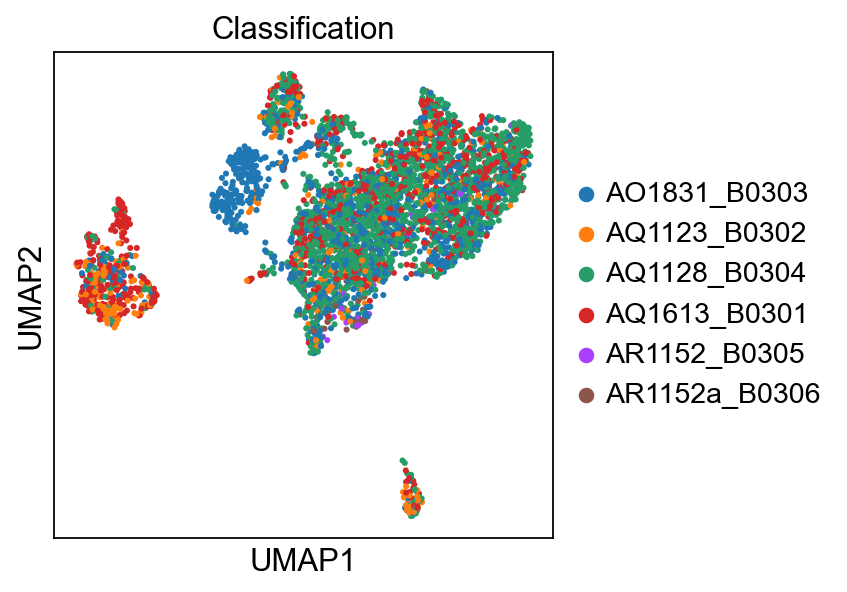

In [93]:
sc.pl.umap(adata, color=['Classification'])

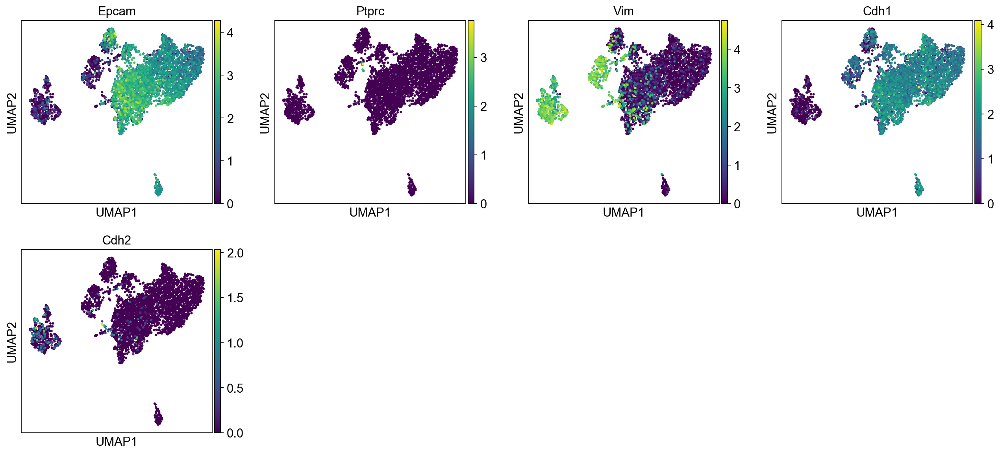

In [94]:
sc.pl.umap(adata, color=['Epcam', 'Ptprc','Vim', 'Cdh1','Cdh2'])

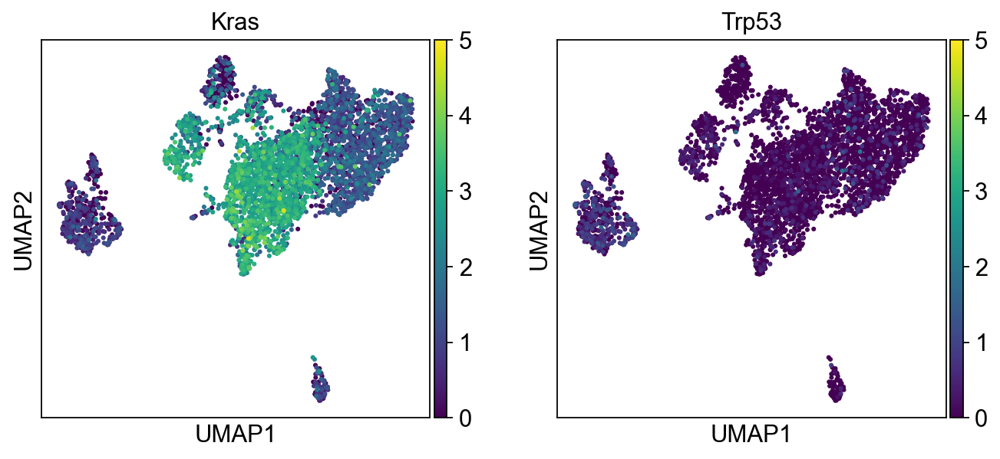

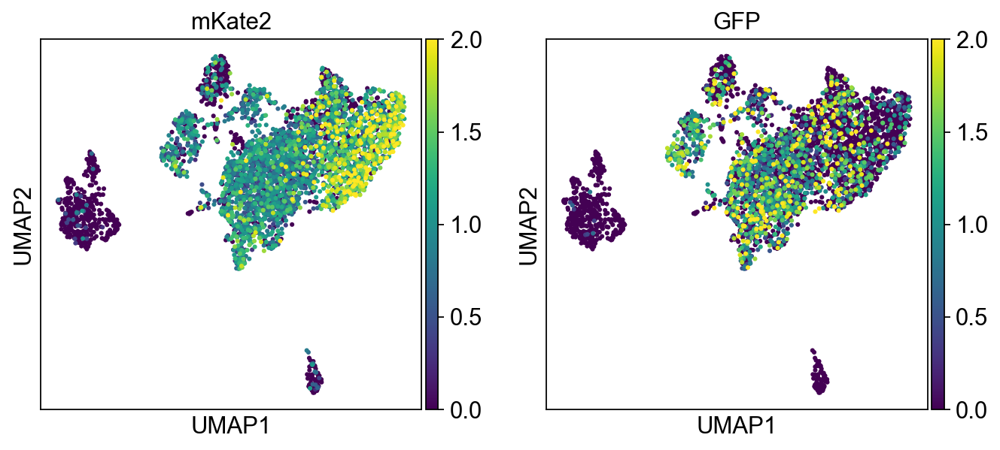

In [95]:
sc.pl.umap(adata, color=['Kras','Trp53'], vmax=5)
sc.pl.umap(adata, color=['mKate2','GFP'], vmax=2)

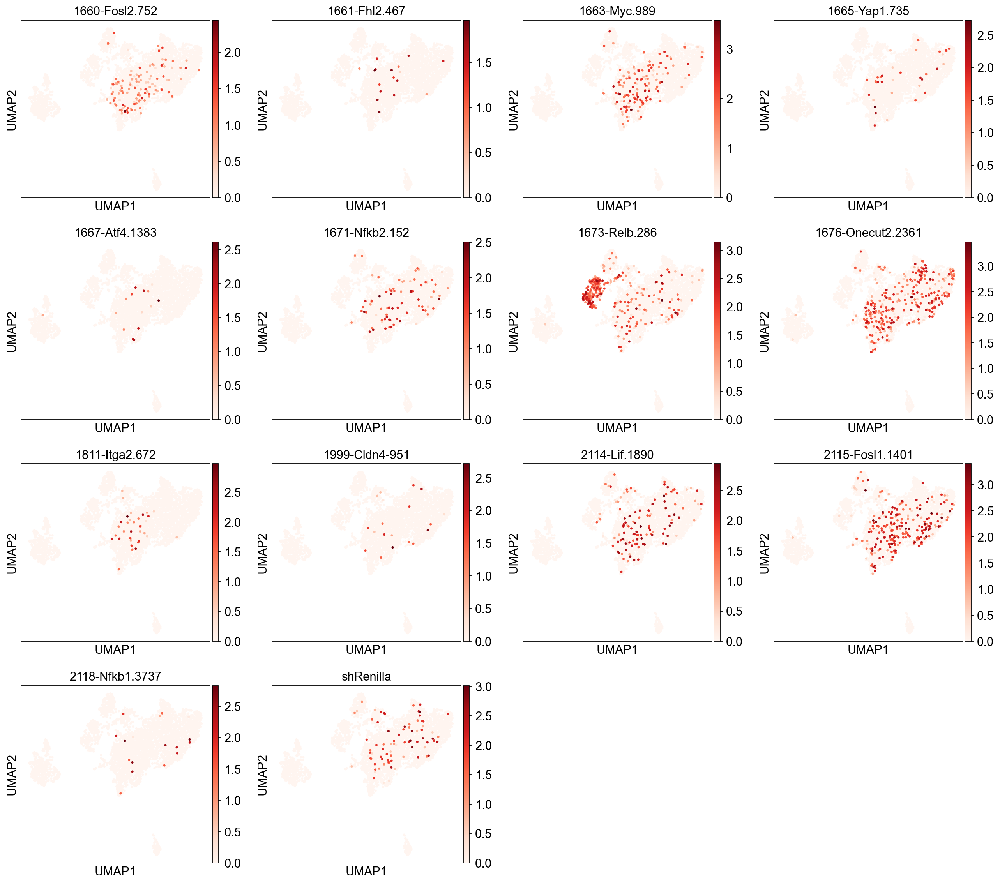

In [96]:
sc.pl.umap(adata, color=library, cmap='Reds')

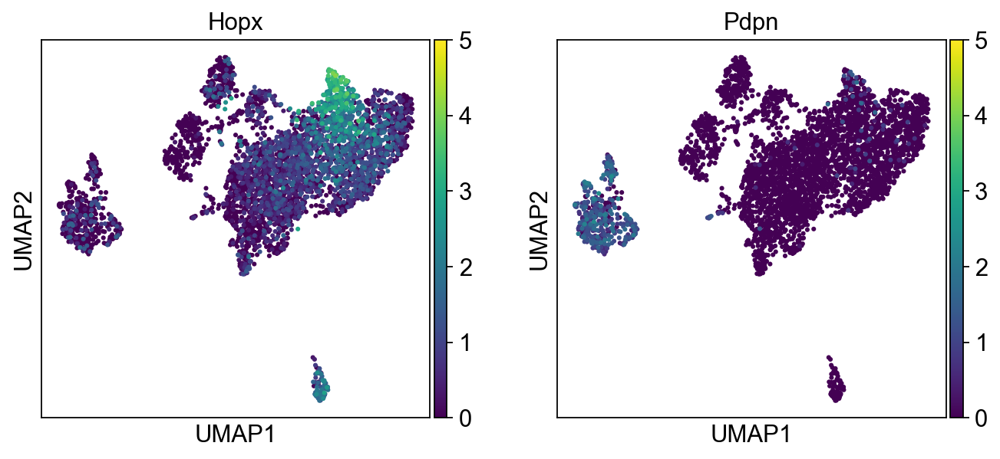

In [97]:
sc.pl.umap(adata, color=['Hopx','Pdpn'], vmax=5)

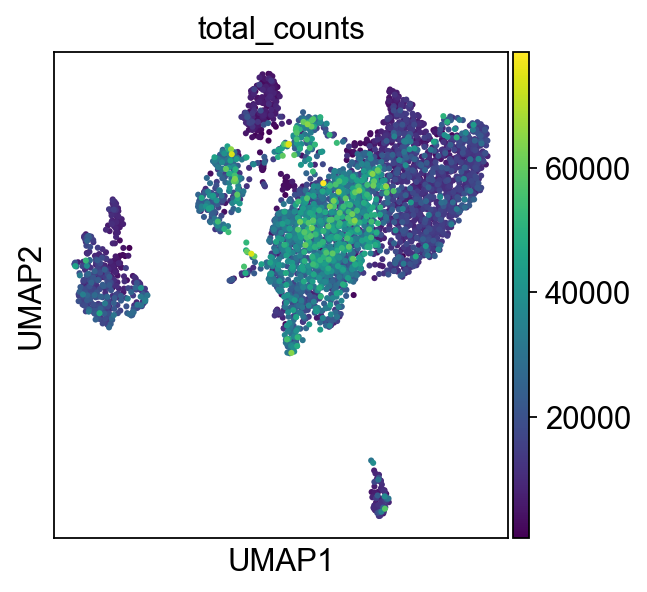

In [98]:
sc.pl.umap(adata, color=['total_counts'])

## Clustering the neighborhood graph

In [99]:
#sc.tl.leiden(adata, resolution=0.30)
sc.tl.leiden(adata, resolution=0.25)

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


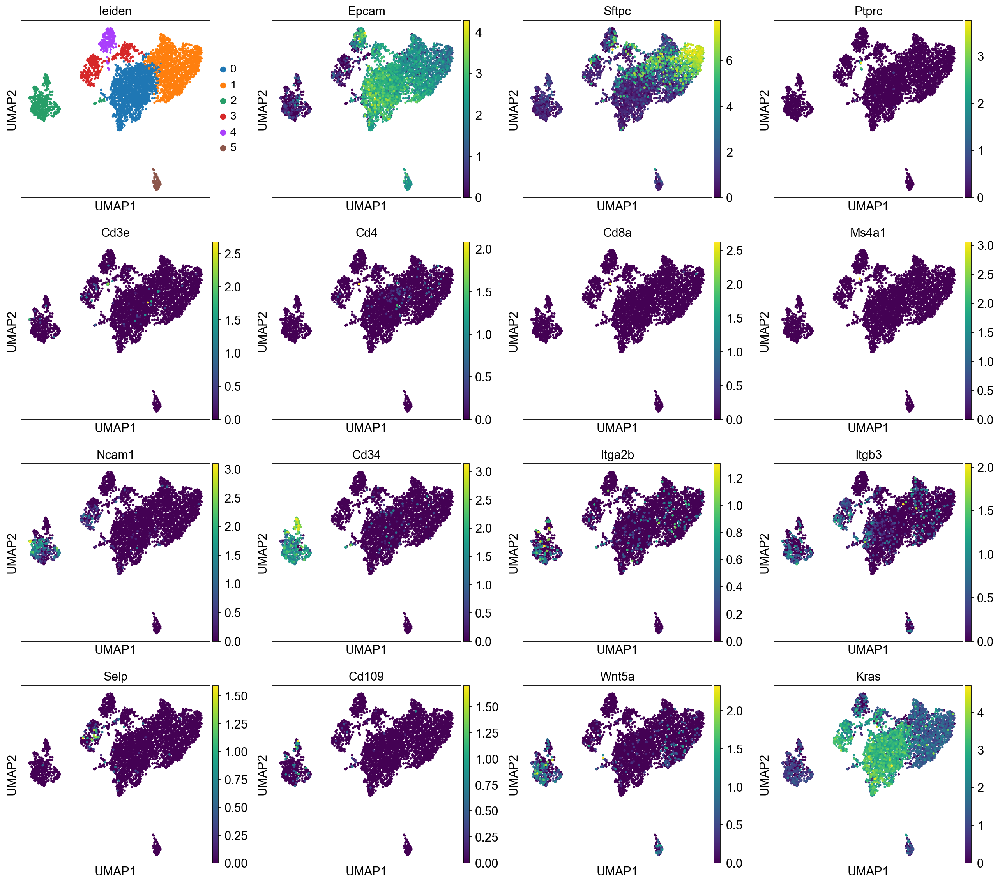

In [100]:
sc.pl.umap(adata, color=['leiden', 'Epcam', 'Sftpc', # Tumor cells
                         'Ptprc', #immune
                         'Cd3e', 'Cd4', 'Cd8a', #T cell
                          'Ms4a1', #'Cd22', # B cell 'Cd19',
                         #'Itgax', 'Il3ra', # Dendritic Cell
                         'Ncam1',# 'Ncr1', # NK Cell
                         'Cd34', # Hematopoetic stem cell
                         #'Cd14', 'Cd33', # macrophage
                         #'Ceacam8' # Granulocyte
                         'Itga2b', 'Itgb3', 'Selp', #platelet
                         #'Gypa',  # erythrocyte
                         #'Mcam', 'Vcam1', 'Pecam1', 'Sele', # endothelial cell
                         'Cd109', 'Wnt5a', 'Kras'])

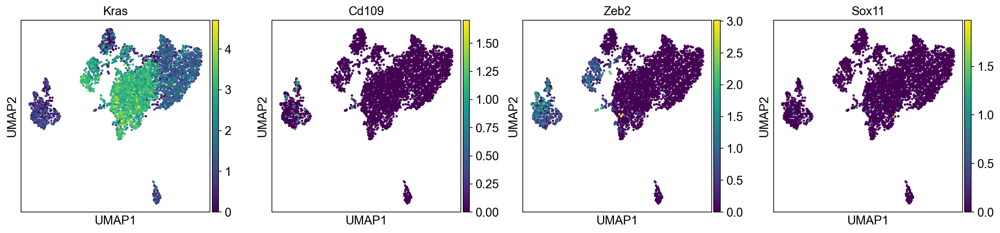

In [101]:
sc.pl.umap(adata, color=['Kras', 'Cd109', 'Zeb2', 'Sox11'])

Save the result.

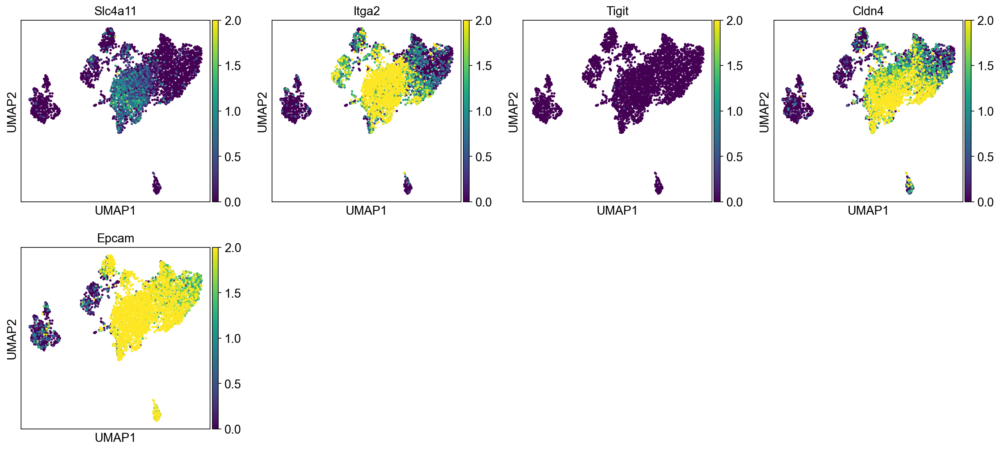

In [102]:
sc.pl.umap(adata, color=['Slc4a11', 'Itga2', 'Tigit', 'Cldn4','Epcam'], vmax=2)

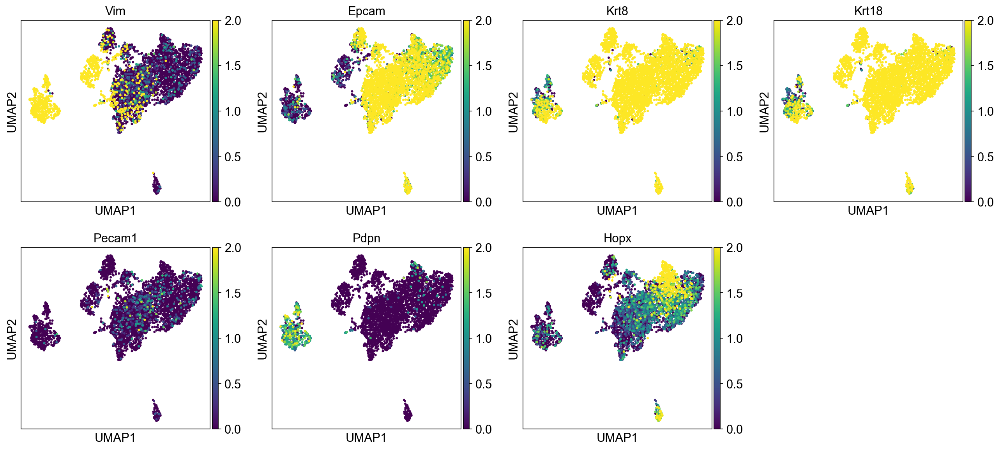

In [103]:
sc.pl.umap(adata, color=['Vim', 'Epcam', 'Krt8', 'Krt18','Pecam1', 'Pdpn', 'Hopx'], vmax=2)

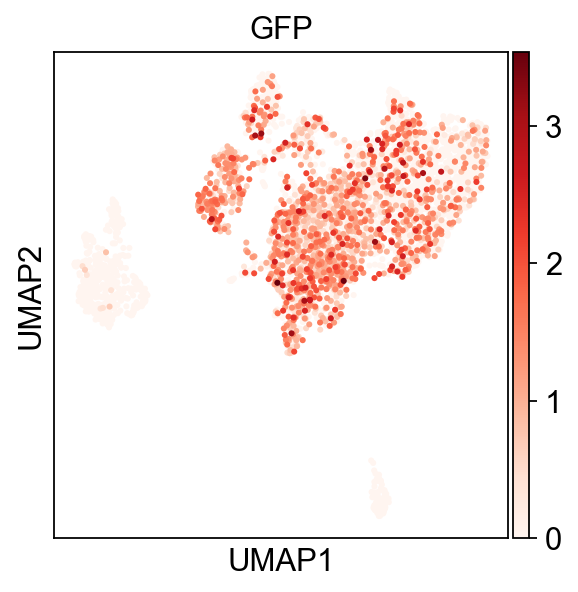

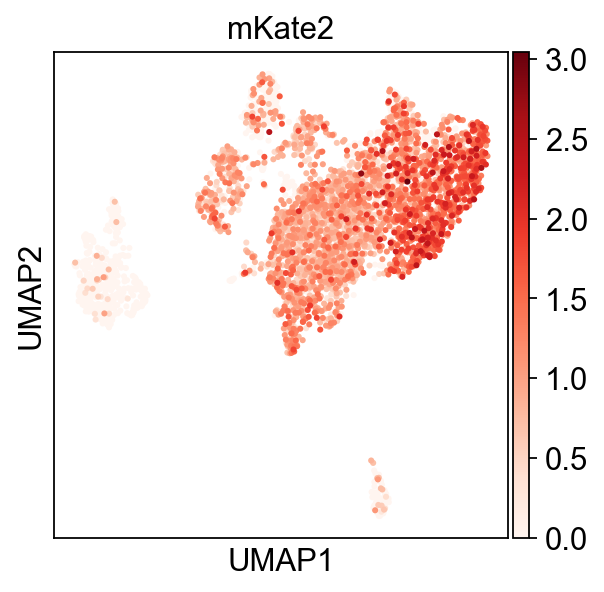

In [104]:
sc.pl.umap(adata, color=['GFP'], cmap='Reds')
sc.pl.umap(adata, color=['mKate2'], cmap='Reds')

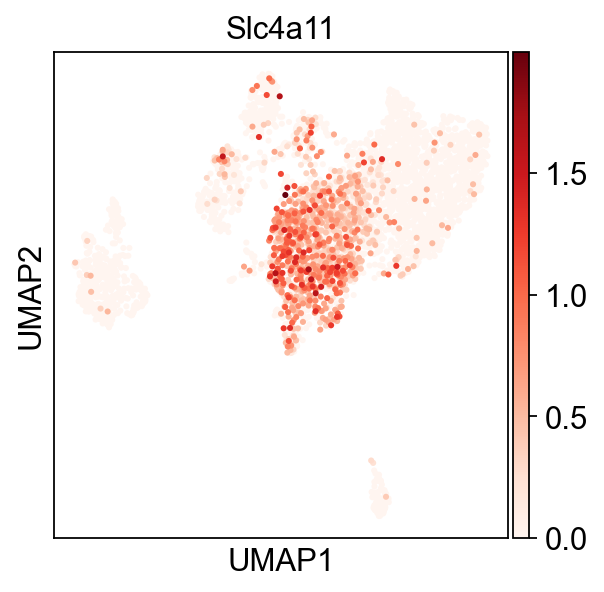

In [105]:
sc.pl.umap(adata, color=['Slc4a11'], cmap='Reds')

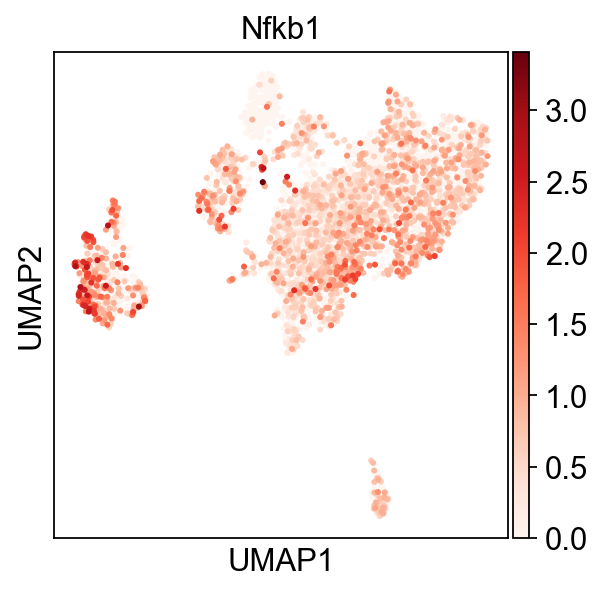

In [106]:
sc.pl.umap(adata, color=['Nfkb1'], cmap='Reds')

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


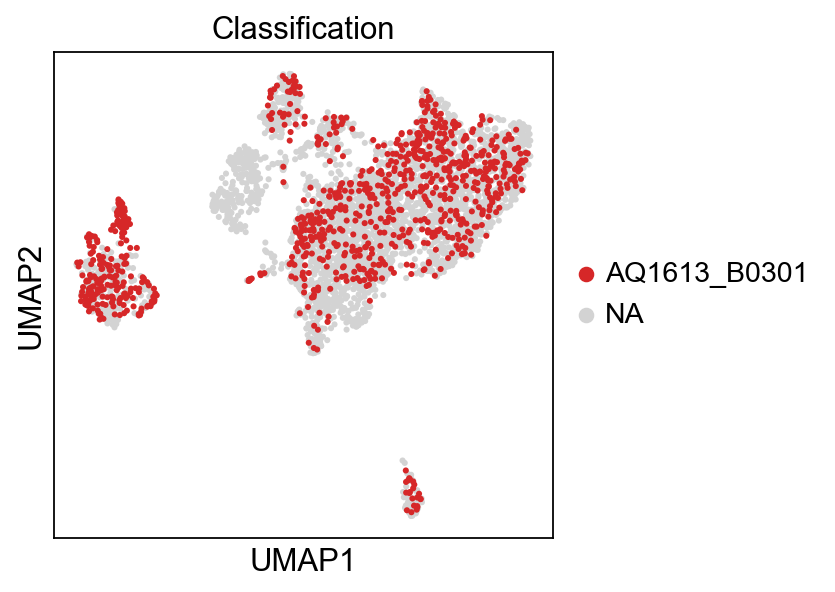

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


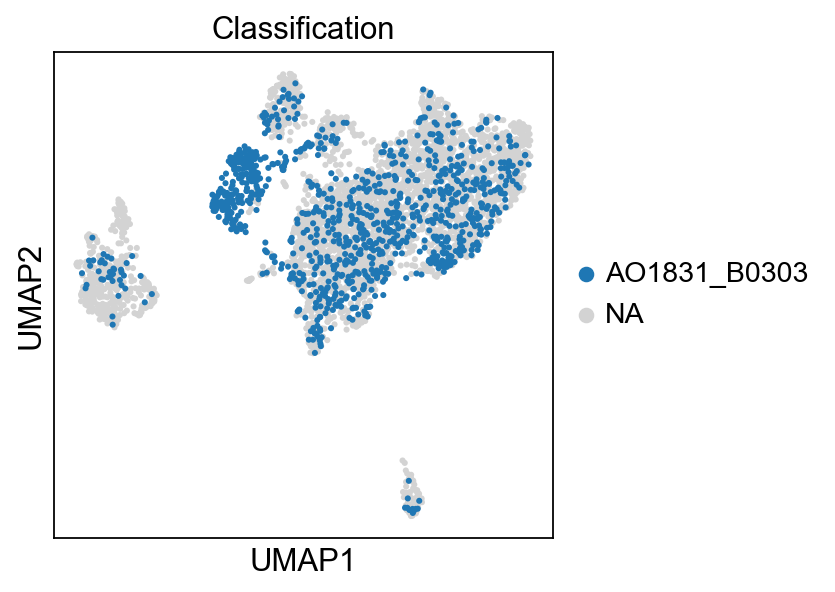

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


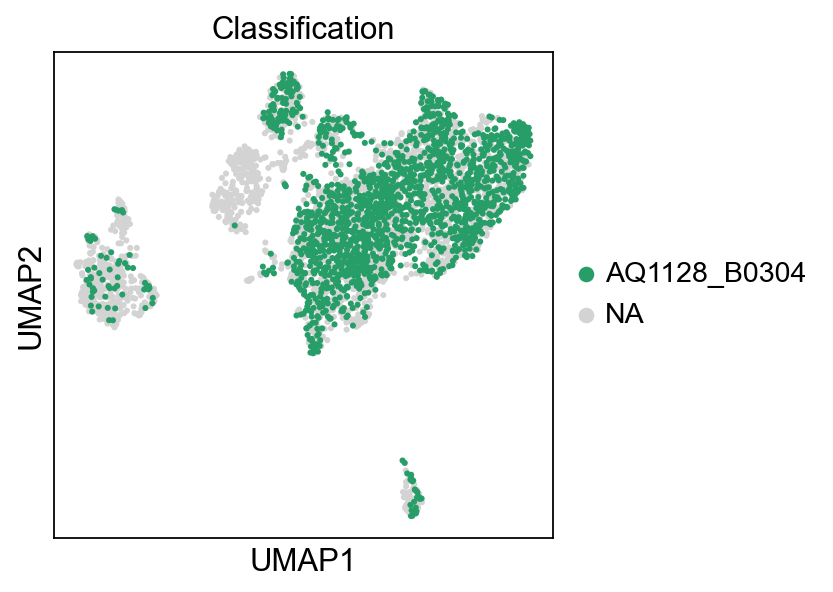

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


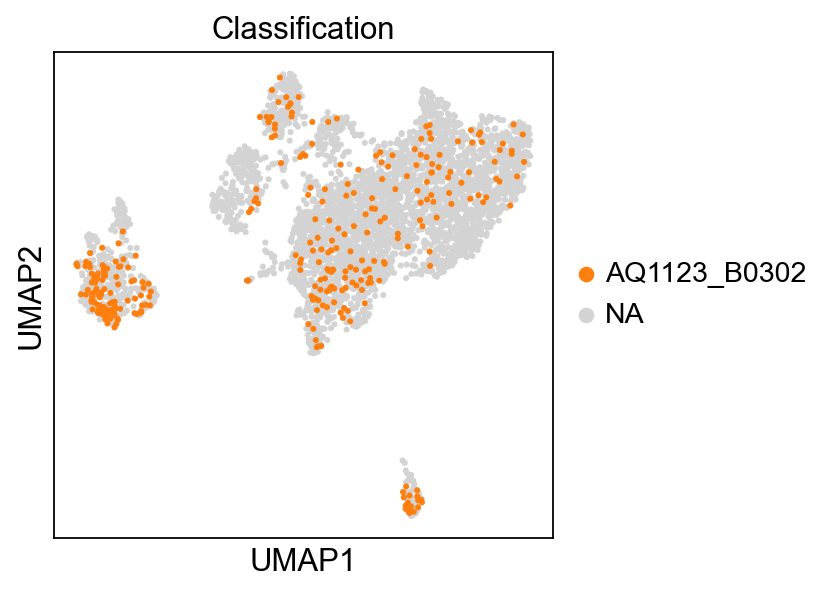

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


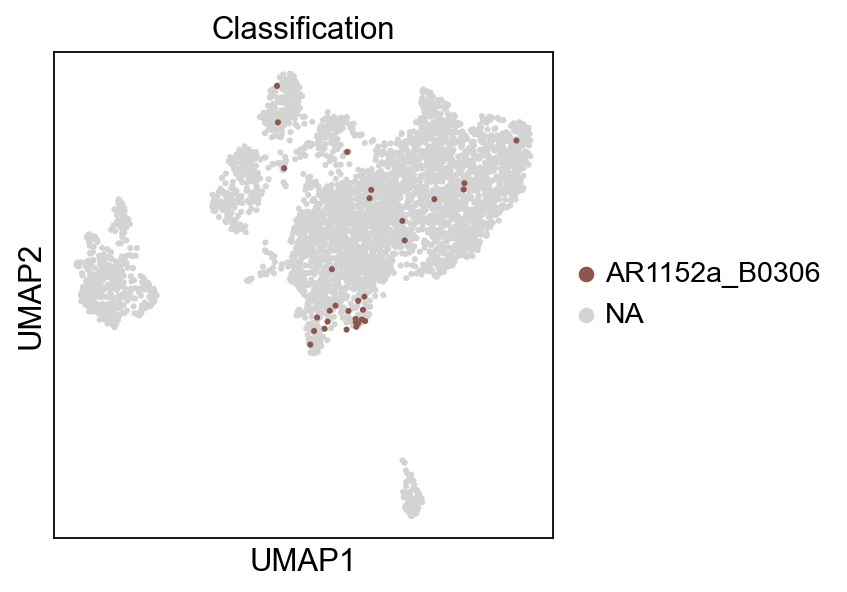

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


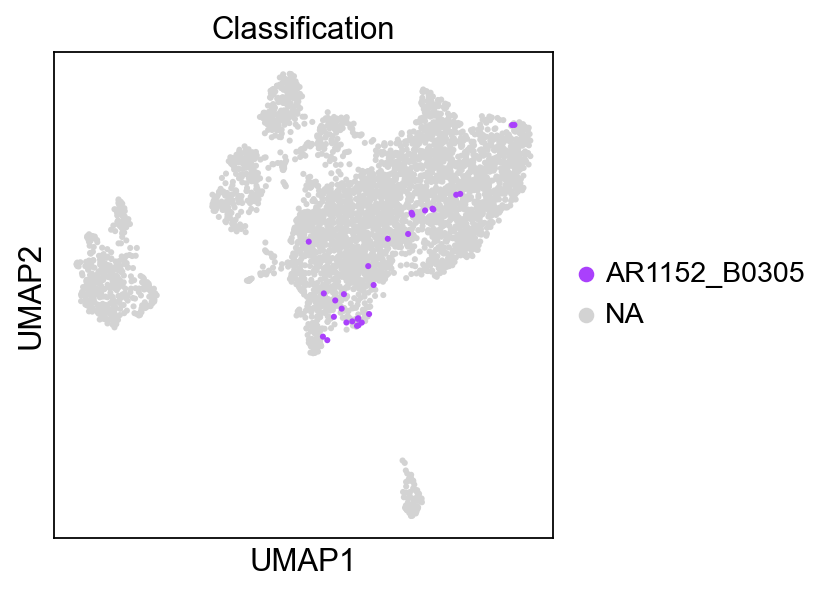

In [107]:
for label in adata.obs['Classification'].unique():
    sc.pl.umap(adata, color='Classification',groups=[label])

In [108]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

In [109]:
adata.obs.keys()

Index(['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'log10GenesPerUMI', 'Classification',
       '1660-Fosl2.752-library', '1661-Fhl2.467-library',
       '1663-Myc.989-library', '1665-Yap1.735-library',
       '1667-Atf4.1383-library', '1671-Nfkb2.152-library',
       '1673-Relb.286-library', '1676-Onecut2.2361-library',
       '1811-Itga2.672-library', '1999-Cldn4-951-library',
       '2114-Lif.1890-library', '2115-Fosl1.1401-library',
       '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count',
       'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'],
      dtype='object')

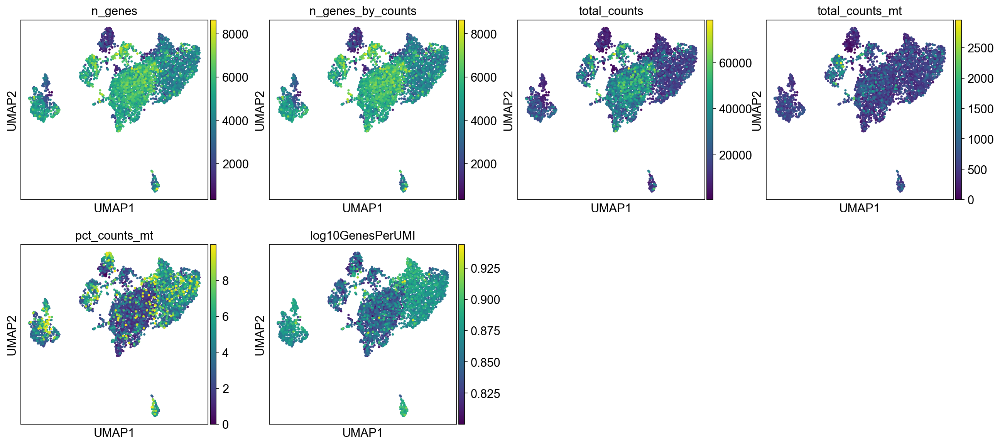

In [110]:
sc.pl.umap(adata,color=['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'log10GenesPerUMI'])

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


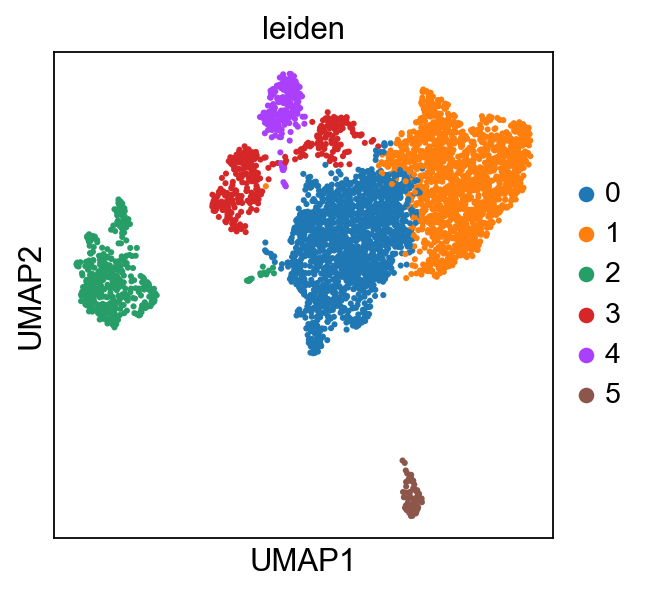

In [111]:
sc.pl.umap(adata,color='leiden')

In [112]:
adata

AnnData object with n_obs × n_vars = 3997 × 2961
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'Classification_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'dis

In [113]:
adata[adata.obs.leiden.isin(['0','1','3','4']),:]

View of AnnData object with n_obs × n_vars = 3501 × 2961
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', '1660-Fosl2.752-library', '1661-Fhl2.467-library', '1663-Myc.989-library', '1665-Yap1.735-library', '1667-Atf4.1383-library', '1671-Nfkb2.152-library', '1673-Relb.286-library', '1676-Onecut2.2361-library', '1811-Itga2.672-library', '1999-Cldn4-951-library', '2114-Lif.1890-library', '2115-Fosl1.1401-library', '2118-Nfkb1.3737-library', 'shRenilla-library', 'GFP_count', 'Cre_count', 'library_id', 'Library', 'cLibrary', 'shRNA', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'Classification_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    ob

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


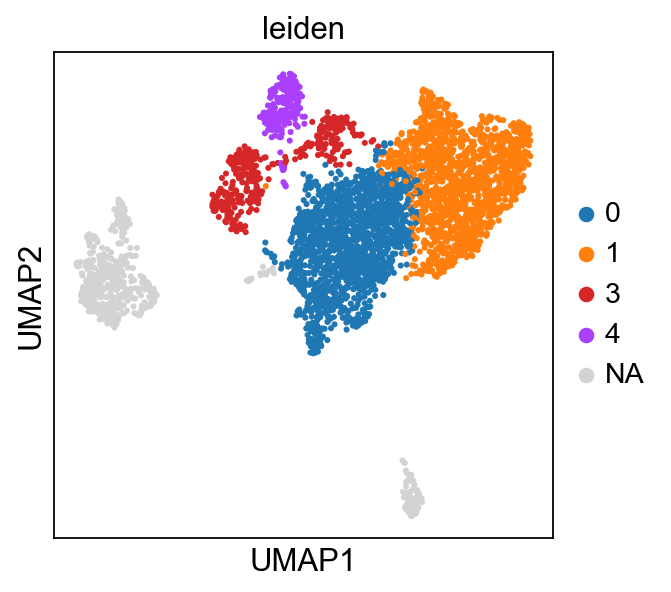

In [114]:
sc.pl.umap(adata, color=['leiden'], groups=['0','1','3','4']) # cluster 3 seems to be fibroblasts

## Select Tumor Cells

In [115]:
# Select only those subset of cells that are useful
adata2 = sc.read('write/allmice-noSCT.h5ad')
adata = adata2[adata.obs['leiden'].isin(['0','1','3','4']),:] # remove fibroblast cells
del adata2

/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [116]:
#fix a bug; 'base' is None but that doesn't seem to have transferred
adata.uns['log1p']['base'] = None

In [117]:
sc.pp.highly_variable_genes(adata)#, batch_key='Classification')

extracting highly variable genes


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:226: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby("mean_bin")["dispersions"]


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/Users/chanj2/opt/miniconda3/envs/solo2/lib/python3.11/site-packages/scanpy/preprocessing/_highly_variable_genes.py:553: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}


In [118]:
#Ensure marker genes aren't making an impact to highly variable gene analysis downstream
adata.var.highly_variable['GFP'] = False
adata.var.highly_variable['mKate2'] = False
adata.var.highly_variable['Cre'] = False
for x in library:
    adata.var.highly_variable[x] = False

/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/2494002207.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata.var.highly_variable['GFP'] = False
/var/folders/xc/wjwqs2j55dqgp2ghrn6nmlj1nlk7kz/T/ipykernel_91783/2494002

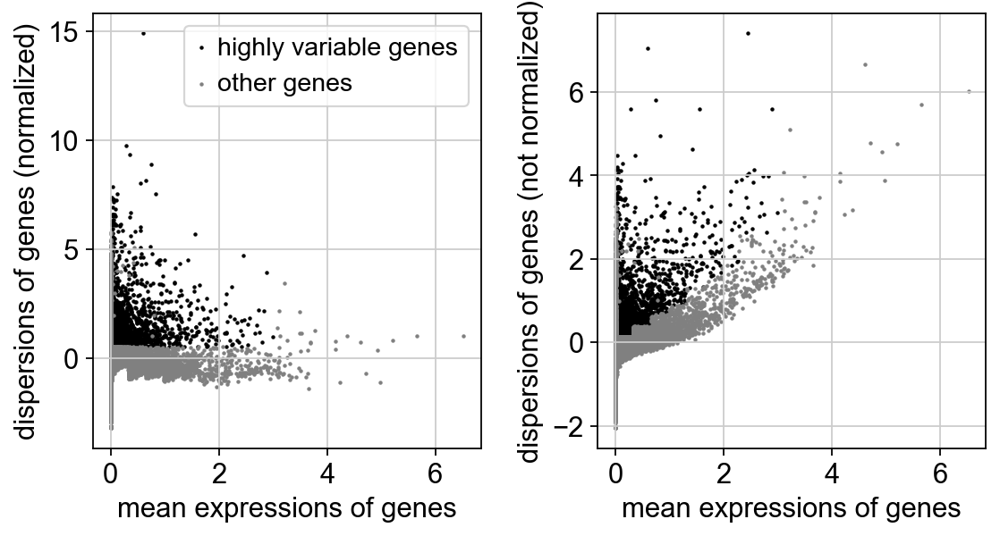

In [119]:
sc.pl.highly_variable_genes(adata)

In [120]:
adata.raw = adata

In [121]:
adata.write('write/allmice-tumornoSCT.h5ad', compression='gzip')
#adata = sc.read('write/allmice-tumornoSCT.h5ad')